# PALSEA Paleo sea-level spatio-temporal hierarchical modelling workshop (11-12 June 2024)

Yucheng Lin - yc.lin@rutgers.edu

with Alex Reedy and Robert Kopp

### Workshop overview

#### Day 1
- Analysis choice 
- A taste of various process level models 
- Temporal Gaussian Process basics


#### Day 2
- Considering temporal uncertainty
- Spatiotemporal Gaussian Process -  basics
- Spatiotemporal Gaussian Process - kernel design and decomposition
- Spatiotemporal Gaussian Process - interaction with physics based models
- Spatiotemporal Gaussian Process - example application (Kopp et al., 2016)

## Day2 


In [ ]:
# Installs the necessary pyro-ppl package as well as mounts the tutorial directory into google colab from drive so users can access the data directory
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    # Install pyro-ppl
    !pip install pyro-ppl cartopy

    # Mount Google Drive
    from google.colab import drive
    drive.mount('/content/drive')

    # Change directory
    %cd /content/drive/MyDrive/PaleoSTeHM/Tutorials/5. PALSEA workshop
else:
    # Continue to the next cell
    pass

In [4]:
#load modules
import matplotlib.pyplot as plt
import matplotlib
import torch
import numpy as np
import pandas as pd
import pyro
import pyro.distributions as dist
import sys
from scipy import interpolate
import seaborn as sns
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.interpolate import RegularGridInterpolator as rgi

sys.path.append('../..')
import PSTHM 
import time

#set plotting style
%matplotlib inline
font = {'weight':'normal',
       'size':20}

matplotlib.rc('font',**font)
matplotlib.rcParams['figure.figsize'] = (12, 6)
import warnings
warnings.filterwarnings("ignore")



### 4. Incorporating temporal uncertainty


When analyzing paleo environmental data, e.g., relative sea-level (RSL) records, it is important to consider the presence of uncertainties in both the reconstruction of RSL (vertical axis) and the chronology (horizontal axis) of the data. While it is relatively straightforward to incorporate output data uncertainty using variance-weighted Gaussian Process (GP) regression (i.e., adding vertical variance into the diagonal of covariance matrix), incorporating chronological uncertainties in GP regression is more challenging.

You should now familiar with some popular GP kernels and how to combine different kernels. And so far, we assume no temporal uncertainty in this tutorial, but which is not the case for most of paleo-environmental studies. So in next tutorial, we will go through two commonly-used method to deal with temporal uncertainty. 

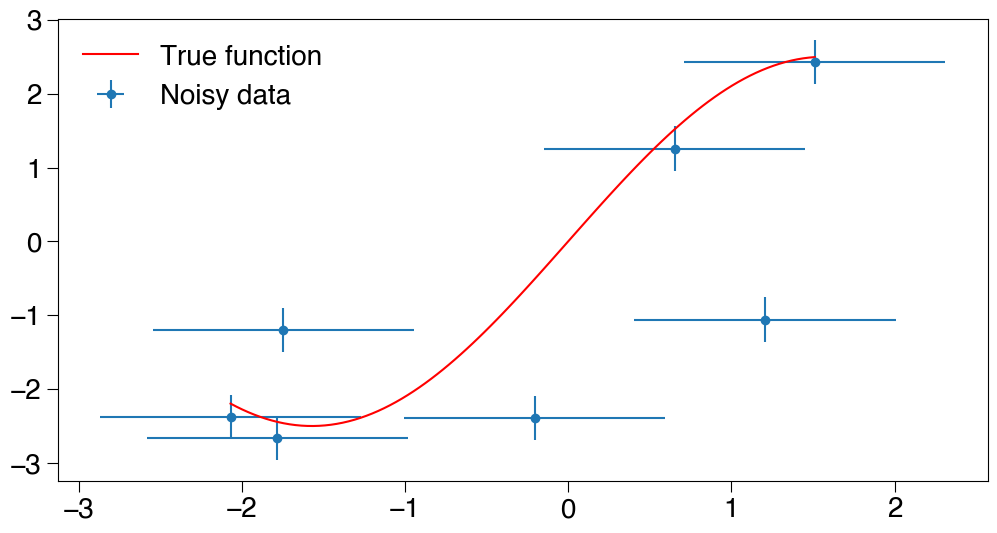

In [7]:
np.random.seed(130)
x = torch.linspace(-3,3,100).double()[np.sort(np.random.randint(0,100,7))]
def f(x):
    return 2.5*torch.sin(x)*torch.ones(len(x)).double()*torch.ones(len(x)).double()**2
y = f(x)

x_noise = 0.8
y_noise =0.3
x_noisy = x+np.random.normal(0,x_noise,len(x))
y_noisy = y+np.random.normal(0,y_noise,len(y))

x_full = torch.linspace(x_noisy.min(),x_noisy.max(),100).double()

plt.errorbar(x_noisy,y_noisy,xerr=x_noise,yerr=y_noise,fmt='o',color='C0',label='Noisy data')
plt.plot(x_full,f(x_full),color='r',label='True function')

plt.legend();

You can clearly see that our data is very noisy and provide really limited information on the right side of the function. Let's start with normal GP only considering the vertical uncertainty. You should be failry familiar with the code below, which is the same code we used for past several tutorials:


In [10]:
torch.manual_seed(123)
# Normal GP without considering x error
pyro.clear_param_store()

#generate a RBF kernel 
RBF_kernel = PSTHM.kernels.RBF(input_dim=1,variance=torch.tensor(1.),lengthscale=torch.tensor(1.))
RBF_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(0.5), torch.tensor(30.)))
RBF_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.1), torch.tensor(30.)))

#generate a GP gression model conditioned on RSL data
gpr = PSTHM.model.GPRegression_V(x_noisy,y_noisy, RBF_kernel,noise=torch.ones(len(x))*y_noise**2,jitter=1e-5)

# #Empirical bayes optimization, default iteration is 1000
gpr,track_list = PSTHM.opti.SVI_optm(gpr,num_iteration=1000)

print('Length Scale: ',track_list['lengthscale'].iloc[-1],'Variance: ',track_list['variance'].iloc[-1])

#cal mean and variance of GP
GP_mean, GP_var = gpr(x_full, full_cov=True)
GP_sd = torch.diag(GP_var).sqrt()  # standard deviation at each input point x


  0%|          | 0/1000 [00:00<?, ?it/s]

Length Scale:  1.778990401220711 Variance:  3.9946824838627903


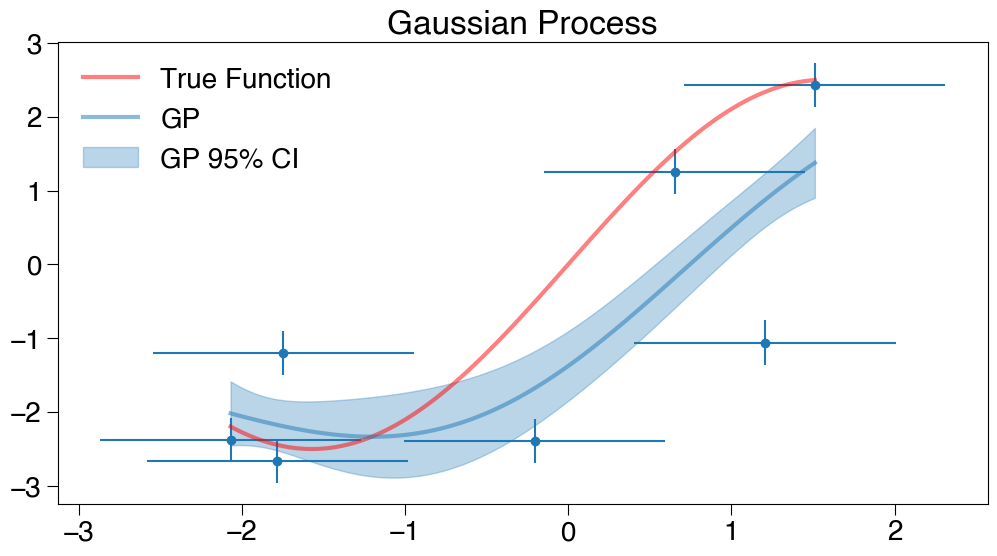

In [11]:
plt.title('Gaussian Process')
plt.errorbar(x_noisy,y_noisy,xerr=x_noise,yerr=y_noise,fmt='o',color='C0')

plt.plot(x_full,f(x_full),color='r',label='True Function',linewidth=3,alpha=0.5)
plt.plot(x_full,GP_mean.detach().numpy(),color='C0',label='GP',linewidth=3,alpha=0.5)
plt.fill_between(x_full,GP_mean.detach().numpy()-2*GP_sd.detach().numpy(),GP_mean.detach().numpy()+2*GP_sd.detach().numpy(),alpha=0.3,color='C0',label='GP 95% CI')
plt.legend();


Due to the significant uncertainties present in both the x and y axes of the data, the 95% credible interval (CI) obtained from normal Gaussian Process (GP) regression fails to accurately capture the true underlying function within the range between 0 and 2.5.

**1. Noisy-Input Gaussian Process**

Now, let's explore the noisy-input GP (NIGP) method. The NIGP method employs a first-order Taylor series approximation, which involves a linear expansion around each input point. This approximation enables the translation of errors in the temporal domain into equivalent errors in the relative sea-level (RSL) domain. Consequently, temporal uncertainty is transformed into RSL uncertainty, which is proportional to the squared gradient of the GP posterior mean.

Let's write it down. Recall in GP background tutorial that, the observation $y$ can be noisy:
$$
y_{i} = f(t_{i},x_{i}) + \epsilon_{i}
$$

where indicates vertical uncertainty for each data point. Additionally, we consider input variable $t$ to be noisy as well here:
$$
\overline{t}_{i} = t_{i} + \delta{i}
$$
where $\overline{t}_{i}$ is the central point estimate of the input variable (e.g., calibrated age from geochronology), $t_{i}$ is the true input variable (e.g., true age), which is unknown and unobserved, and $\delta_{i}$ is the uncertainty for input variable (e.g., chronological uncertainty). For GP, it is default to assume both $\epsilon$ and $\delta$ to be normally distributed. 

For GP framework, vertical uncertainty can be easily incorporated by changing $K^{-1}$ (details in section 3 of tutorial 4) to:
$$
\hat{K}^{-1} = (K+\sigma_{\epsilon}^2 I)^{-1}
$$
where $I$ is an identity matrix and $\sigma_{\epsilon}$ indicates one-sigma observational uncertainty for each data point. To implement NIGP, we need to estimate the gradient of GP posterior mean relative to input variable: $\partial f = \frac{\partial f}{\partial t}$. It can then be used to transform temporal uncertainty into RSL uncertainty, and therefore, the covariance matrix is:
$$
\hat{K}^{-1}_{NIGP} = (K+\sigma_{epsilon}^2 I +\sigma_{\delta}^2\frac{\partial f}{\partial t}I )^{-1}
$$
where $\sigma_{\delta}$ is one-sigma uncertainty for input variable. 

To implement the NIGP method, we use an iterative method, which calculate $\frac{\partial f}{\partial t}$ for every iteration of optimization. To do this in PaleoSTeHM framework is very easy, you just change the optimization function from `SVI_optm` to `SVI_NI_optm`, which requires an extra input of horizontal uncertainty. 

In [12]:

pyro.clear_param_store()

#generate a RBF kernel 
NI_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,variance=torch.tensor(1.),lengthscale=torch.tensor(1.))
NI_RBF_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(0.1), torch.tensor(30.)))
NI_RBF_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.1), torch.tensor(30.)))

#generate a GP gression model conditioned on RSL data
NI_gpr = PSTHM.model.GPRegression_V(x_noisy,y_noisy, RBF_kernel,noise=torch.ones(len(x))*y_noise**2,jitter=1e-5)

#Empirical bayes optimization, default iteration is 1000
NI_gpr,track_list = PSTHM.opti.SVI_NI_optm(NI_gpr,torch.tensor(x_noise),num_iteration=1000)
print('Length Scale: ',track_list['lengthscale'].iloc[-1],'Variance: ',track_list['variance'].iloc[-1])

#cal mean and variance of GP
NIGP_mean, NIGP_var = NI_gpr(x_full, full_cov=True)
NIGP_sd = torch.diag(NIGP_var).sqrt()  # standard deviation at each input point x

  0%|          | 0/1000 [00:00<?, ?it/s]

Length Scale:  2.389514370701743 Variance:  3.8110091107567396


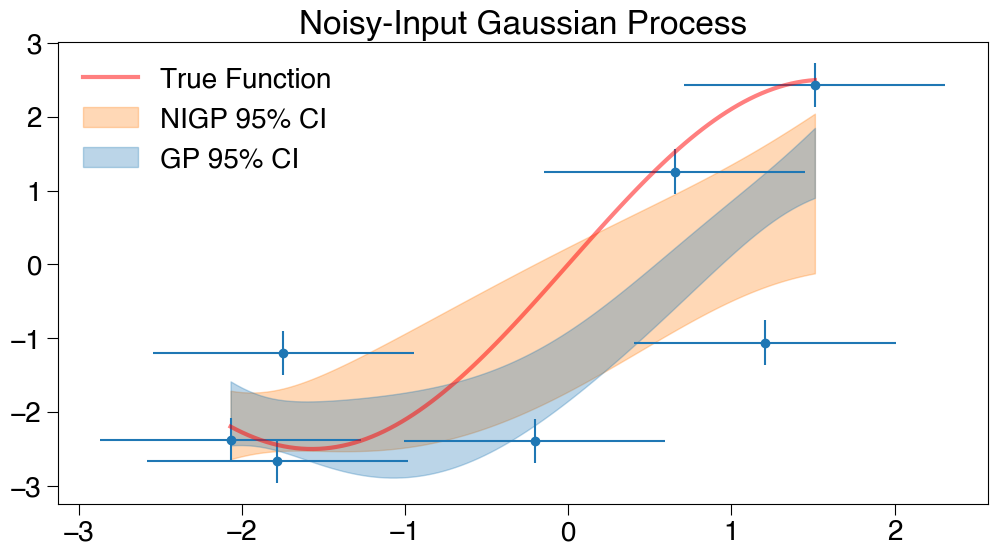

In [13]:
plt.title('Noisy-Input Gaussian Process')

plt.errorbar(x_noisy,y_noisy,xerr=x_noise,yerr=y_noise,fmt='o',color='C0')

plt.plot(x_full,f(x_full),color='r',label='True Function',linewidth=3,alpha=0.5)
# plt.plot(x_full,GP_mean.detach().numpy(),color='C0',label='GP',linewidth=3,alpha=0.5)

# plt.plot(x_full,NIGP_mean.detach().numpy(),color='C1',label='NIGP',linewidth=3,alpha=0.5)
plt.fill_between(x_full,NIGP_mean.detach().numpy()-2*NIGP_sd.detach().numpy(),NIGP_mean.detach().numpy()+2*NIGP_sd.detach().numpy(),alpha=0.3,color='C1',label='NIGP 95% CI')
plt.fill_between(x_full,GP_mean.detach().numpy()-2*GP_sd.detach().numpy(),GP_mean.detach().numpy()+2*GP_sd.detach().numpy(),alpha=0.3,color='C0',label='GP 95% CI')
plt.legend();

Upon incorporating information about chronological errors, the 95% credible interval (CI) obtained through the noisy-input Gaussian Process (NI-GP) method exhibits an improvement, demonstrating a more reasonable behavior when dealing with the noisy data. Notably, the 95% CI successfully captures the true underlying function across a larger range. It should be noted that, given the same hyperparameters, considering chronological uncertainty using NI-GP will always results in larger 95% CI. 

**2. Errors-In-Variable Gaussian Process**

Another approach to address temporal uncertainty is by directly sampling temporal uncertainty using the errors-in-variable (EIV) framework through the utilization of the Markov Chain Monte Carlo (MCMC) algorithm, which enables a Fully Bayesian Analysis. This can be done by calculating covariance matrix with input uncertainty.

It is important to note that specifying the prior distribution is crucial in the Fully Bayesian Analysis as it directly impacts the prediction results. To implement EIV-GP in PaleoSTeHM, we change the GP model from `GPRegression_V` to `GPRegression_EIV` and fill this new model to MCMC sampler as before.

In [14]:
# EIV-GP method
pyro.clear_param_store()

#generate a RBF kernel 
RBF_kernel = PSTHM.kernels.RBF(input_dim=1)
RBF_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(0.1), torch.tensor(30.)))
RBF_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.1), torch.tensor(30.)))

#generate a GP gression model conditioned on RSL data
EIV_gpr = PSTHM.model.GPRegression_EIV(x_noisy, y_noisy, x_noise = x_noise**2,kernel=RBF_kernel,noise=torch.tensor(y_noise**2),jitter=1e-5)

#use NUTS mcmc to sample the posterior distribution of hyperparameters
mcmc = PSTHM.opti.NUTS_mcmc(EIV_gpr,num_samples=2000,warmup_steps=200)


Sample: 100%|██████████| 2200/2200 [00:46, 47.74it/s, step size=2.11e-01, acc. prob=0.822]


In [15]:
#predict the mean and variance of GP
post_x = mcmc.get_samples()['xerr'].detach().numpy()+x_noisy[None,:].detach().numpy()
post_y = np.random.normal(y_noisy,y_noise,[2000,len(y)])

full_bayes_y = np.zeros([2000,len(x_full)])
full_bayes_std = np.zeros([2000,len(x_full)])

for i in range(2000):
    EIV_gpr.X = torch.tensor(post_x[i])
    EIV_gpr.y = torch.tensor(post_y[i])
    EIV_gpr.kernel.lengthscale = mcmc.get_samples()['kernel.lengthscale'][i]
    EIV_gpr.kernel.variance = mcmc.get_samples()['kernel.variance'][i]
    test_mean,test_cov = EIV_gpr(x_full)
    full_bayes_y[i] = test_mean.detach().numpy()
    full_bayes_std[i] = test_cov.sqrt().detach().numpy()
EIVGP_mean = np.mean(full_bayes_y,axis=0)
EIVGP_sd = np.std(full_bayes_y,axis=0)

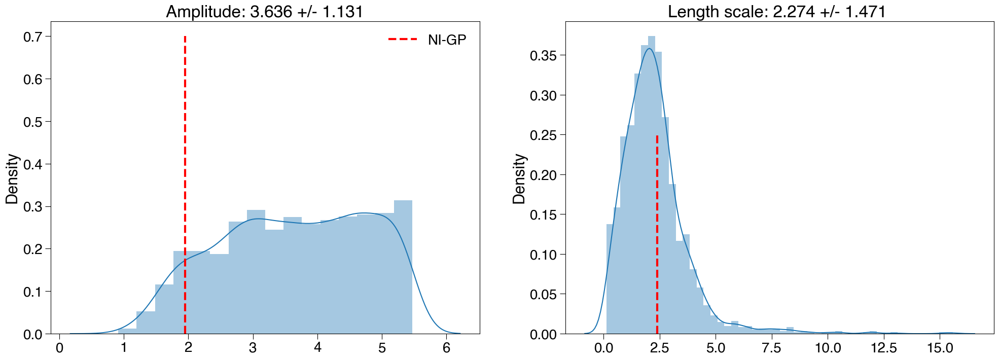

In [18]:
mcmc_variance =mcmc.get_samples()['kernel.variance']
mcmc_lengthscale = mcmc.get_samples()['kernel.lengthscale']

plt.figure(figsize=(24,8))
plt.subplot(121)
sns.distplot(mcmc_variance**0.5)
plt.vlines(NI_gpr.kernel.variance.item()**0.5,0,0.7,color='r',linestyle='--',label='NI-GP',linewidth=3)
plt.title('Amplitude: {:5.3f} +/- {:5.3f}'.format(torch.mean(mcmc_variance**0.5),
                                            torch.std(mcmc_variance**0.5)))
plt.legend()
plt.subplot(122)
sns.distplot(mcmc_lengthscale)
plt.vlines(NI_gpr.kernel.lengthscale.item(),0,0.25,color='r',linestyle='--',label='NI-GP',linewidth=3)
plt.title('Length scale: {:5.3f} +/- {:5.3f} '.format(torch.mean(mcmc_lengthscale),
                                                           torch.std(mcmc_lengthscale)));

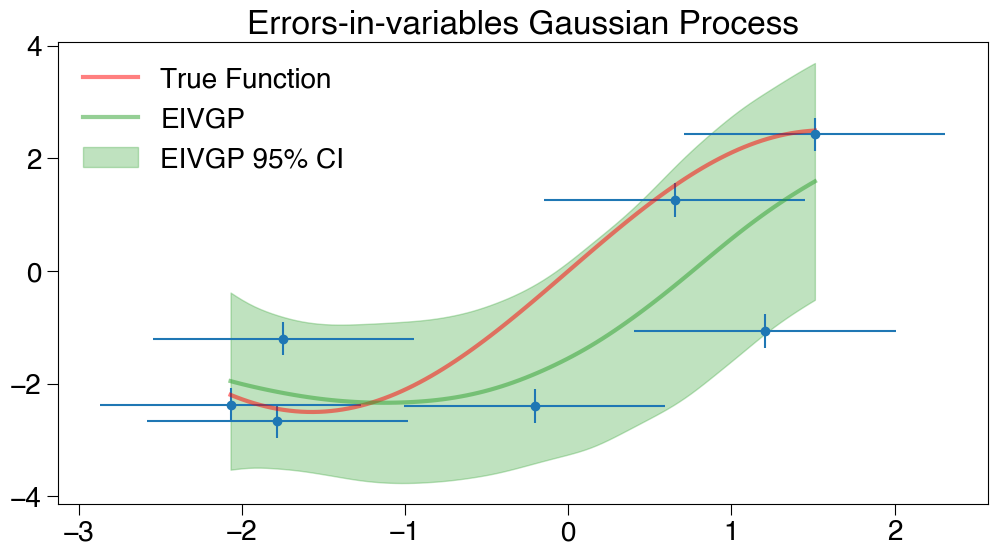

In [19]:


plt.title('Errors-in-variables Gaussian Process')
plt.errorbar(x_noisy,y_noisy,xerr=x_noise,yerr=y_noise,fmt='o',color='C0')
plt.plot(x_full,f(x_full),color='r',label='True Function',linewidth=3,alpha=0.5)
plt.plot(x_full,EIVGP_mean,color='C2',label='EIVGP',linewidth=3,alpha=0.5)
plt.fill_between(x_full,EIVGP_mean-2*EIVGP_sd,EIVGP_mean+2*EIVGP_sd,alpha=0.3,color='C2',label='EIVGP 95% CI')
plt.legend();



It is quite evident that the 95% CI obtained through the Errors-in-Variable Gaussian Process (EIV-GP) method exhibits a more structured behavior compared to the Noisy-Input GP (NI-GP) method. This improved structure is a result of directly sampling the x errors using the MCMC algorithm within the EIV-GP framework. Like NI-GP, the 95% CI derived from the EIV-GP method captures the true underlying function over a good area.

**3. Performance Comparison**

Now, let's compare and visualize the outcomes of the three different methods by plotting them together for a comprehensive evaluation. We also calculate the percentage of whether their 68/95% confidence interval can cover the true function as an extra evaluation metric. 

GP 68/95% coverage percentage:  0.18/ 0.39
NIGP 68/95% coverage percentage:  0.28/ 0.62
EIVGP 68/95% coverage percentage:  0.43/ 1.00


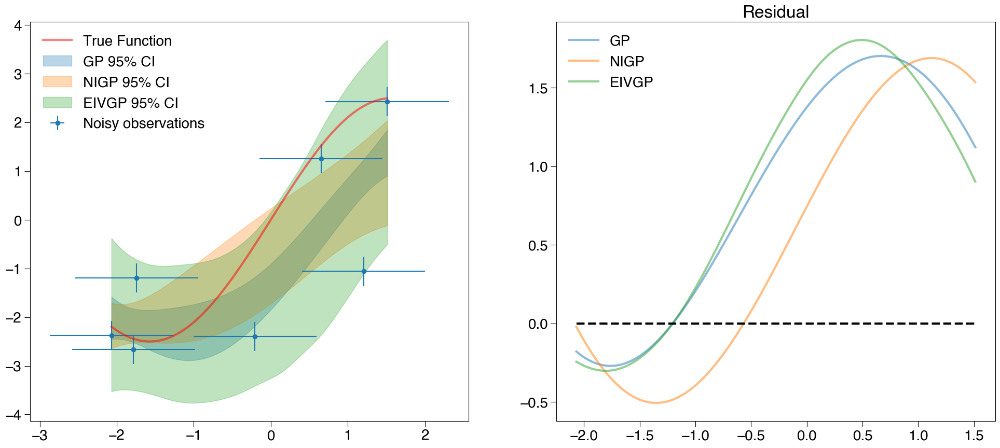

In [20]:
print('GP 68/95% coverage percentage: {0:5.2f}/{1:5.2f}'.format(np.mean(np.abs(GP_mean.detach().numpy()-f(x_full).detach().numpy())<GP_sd.detach().numpy()),
      np.mean(np.abs(GP_mean.detach().numpy()-f(x_full).detach().numpy())<2*GP_sd.detach().numpy())))
print('NIGP 68/95% coverage percentage: {0:5.2f}/{1:5.2f}'.format(np.mean(np.abs(NIGP_mean.detach().numpy()-f(x_full).detach().numpy())<NIGP_sd.detach().numpy()),
      np.mean(np.abs(NIGP_mean.detach().numpy()-f(x_full).detach().numpy())<2*NIGP_sd.detach().numpy())))
print('EIVGP 68/95% coverage percentage: {0:5.2f}/{1:5.2f}'.format(np.mean(np.abs(EIVGP_mean-f(x_full).detach().numpy())<EIVGP_sd),
      np.mean(np.abs(EIVGP_mean-f(x_full).detach().numpy())<2*EIVGP_sd)))

plt.figure(figsize=(24,10))
plt.subplot(121)
plt.errorbar(x_noisy,y_noisy,xerr=x_noise,yerr=y_noise,fmt='o',color='C0',label='Noisy observations')

plt.plot(x_full,f(x_full),color='r',label='True Function',linewidth=3,alpha=0.5)

plt.fill_between(x_full,GP_mean.detach().numpy()-2*GP_sd.detach().numpy(),GP_mean.detach().numpy()+2*GP_sd.detach().numpy(),alpha=0.3,color='C0',label='GP 95% CI')
plt.fill_between(x_full,NIGP_mean.detach().numpy()-2*NIGP_sd.detach().numpy(),NIGP_mean.detach().numpy()+2*NIGP_sd.detach().numpy(),alpha=0.3,color='C1',label='NIGP 95% CI')
plt.fill_between(x_full,EIVGP_mean-2*EIVGP_sd,EIVGP_mean+2*EIVGP_sd,alpha=0.3,color='C2',label='EIVGP 95% CI')

plt.legend()

plt.subplot(122)
plt.plot(x_full,f(x_full)-GP_mean.detach().numpy(),color='C0',label='GP',linewidth=3,alpha=0.5)
plt.plot(x_full,f(x_full)-NIGP_mean.detach().numpy(),color='C1',label='NIGP',linewidth=3,alpha=0.5)
plt.plot(x_full,f(x_full)-EIVGP_mean,color='C2',label='EIVGP',linewidth=3,alpha=0.5)
plt.hlines(0,x_full.min(),x_full.max(),linewidth=3,linestyles='--',color='k')
plt.title('Residual')
plt.legend();

It seems like EIV-GP is doing a great job here, followed by NI-GP and GP. This is largely because EIV-GP is able to sample the posterior distribution of age uncertainty of each data, therefore, EIV-GP is trying to find the `TRUE` age distribution. Meanwhile, GP and EIV-GP do not modify the noisy prior age distributions although NI-GP is trying to improve the prediction accuracy based on nosiy prior distributions. 

To make it more clear, we can compare the noisy prior distributions, posterior distributions with `True age` respectively.


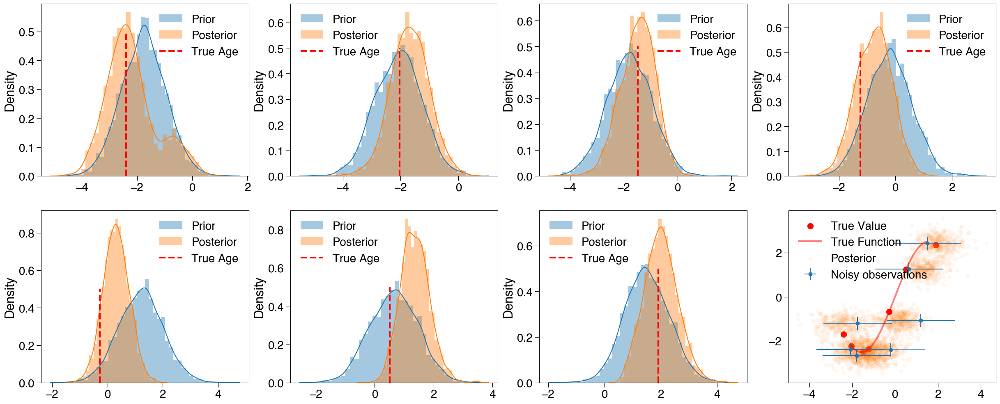

In [21]:
plt.figure(figsize=(30,12))
for i in range(7):
    plt.subplot(2,4,i+1)
    sns.distplot(np.random.normal(x_noisy[i],x_noise,3000),label='Prior')
    sns.distplot(post_x[:,i],label='Posterior')
    plt.vlines(x[i],0,0.5,color='r',linestyle='--',label='True Age',linewidth=3)
    plt.legend()
plt.subplot(2,4,8)
plt.errorbar(x_noisy,y_noisy,xerr=x_noise*2,yerr=y_noise,fmt='o',color='C0',label='Noisy observations')
plt.scatter(x,y,color='r',label='True Value',s=100)
plt.plot(x_full,f(x_full),color='r',label='True Function',linewidth=3,alpha=0.5)

for i in range(0,2000,5):
    if i ==0:
        plt.scatter(post_x[i],post_y[i],color='C1',alpha=0.05,label='Posterior')
    else:
        plt.scatter(post_x[i],post_y[i],color='C1',alpha=0.05)
plt.legend();

### 5. Spatiotemporal Gaussian Process -  basics


**Geographical squared distance matrix**

To start let's think about how should we incorporate spatial information into account. A stratightforward way is to use longitude and latitude values as two input variables to GP regression just like what we did for time data. However, in real-world the distance calculated between longitude and latitude can be problematic since Earth is actually a sphere instead of a plate. For example, the distance between (19 $\degree$ W, 1 $\degree$ N) and (20 $\degree$ W, 1 $\degree$ N) is 1 $\degree$, and the distance between (19 $\degree$ W, 80 $\degree$ N) and (20 $\degree$ W, 80 $\degree$ N) is $\degree$ is also one degree. But in fact, the former distance is around 111.3 km and the latter distance is only 19.4 km! In this case, it's not a good idea to use longitude and latitude here.

Instead, we should use the true geographical distance between each two data points to construct a sqaured distance matrix and covariance matrix, which can therefore capture their correlation purely based on their geographical proximity. Another good news is that, instead of adding two extra variables of longitude and latitude, we can use just one input variable to present spatial information (i.e., geographical distance). To calculate geographical distance, we can use the following equations (you don't necessarily need to understand them):

$$ 
\Delta\phi = \phi_2 - \phi_1 \\
\Delta\theta = \theta_2 - \theta_1 \\
a = \sin^2(\frac{\Delta\theta}{2})  + \cos(\theta_1) \cdot \cos(\theta_2) \cdot \sin^2(\frac{\Delta\phi}{2}) \\
\text{GeoD}= 2 \cdot \text{atan2}(\sqrt{a}, \sqrt{1 - a}) 
$$
where $\theta_{1}$ and $\phi_{1}$ are the latitude and longitude of the first point in radians, $\theta_{2}$ and $\phi_{2}$ are the latitude and longitude of the second point in radians. GeoD represents geographical distance between these two points in raians, which varies between 0 and 2 $\pi$ (roughly 6.283). If you wish, you can multiply this with Earth radius (6371 km) to get the real-world distance. 

Based on this equation, we can calculate the geographical sqaured distance matrix ($D_{Geo}$) for each data location ($x$) as we did for time data:

$$
D_{Geo}^2 = \begin{pmatrix}
  GeoD(x_{1},x_{1})^2      & GeoD(x_{1},x_{2})^2   & \cdots  & GeoD(x_{1},x_{n})^2  \\
  GeoD(x_{2},x_{1})^2       &   GeoD(x_{2},x_{2})^2     & \cdots  & GeoD(x_{2},x_{n})^2  \\
  \vdots  & \vdots   & \ddots  & \vdots \\
  GeoD(x_{n},x_{1})^2        & GeoD(x_{n},x_{2})^2     & \cdots  & GeoD(x_{n},x_{n})^2  \\
\end{pmatrix}
$$
where $GeoD(x_{1},x_{2})$ defines geographical distance between data locations 1 and 2. 




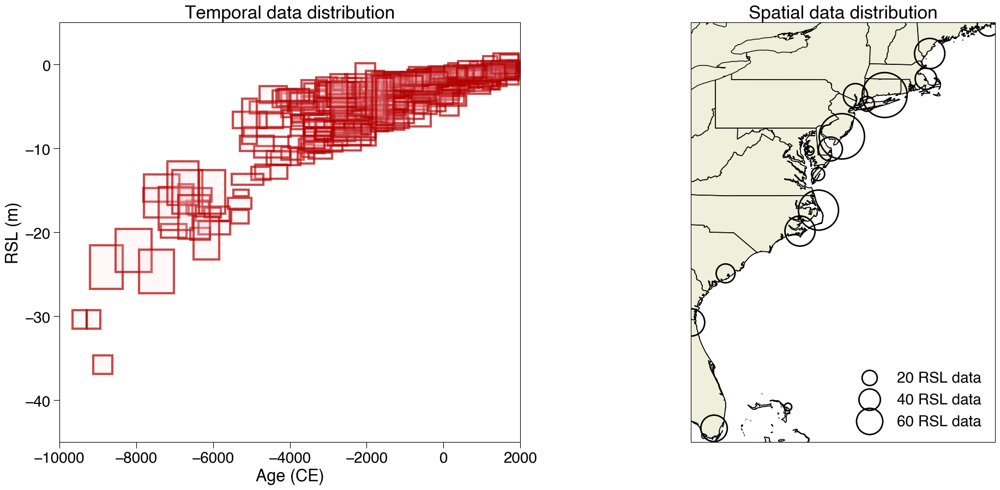

In [2]:
#load data
#ml is marine limiting data, tl is terrestrial limiting data, SLIP is sea-level index points
ml, SLIP, tl = PSTHM.load.load_regional_rsl_data('../../Data/US_Atlantic_Coast_for_ESTGP.csv',CE=True)
age, y, y_sigma, age_sigma, rsl_lon,rsl_lat, rsl_region = SLIP

rsl_coord = torch.tensor(np.vstack((rsl_lat,rsl_lon)).T)

#--------Plot data distribution----------------
fig = plt.figure(figsize=(24,10))
gs = fig.add_gridspec(1, 2)

ax = fig.add_subplot(gs[0, :1])
PSTHM.plotting.plot_uncertainty_boxes(age,y, age_sigma*2,y_sigma*2,ax=ax,CE=True)
ax.set_xlim(-10000,2000)
ax.set_ylim(-45,5)
ax.set_title('Temporal data distribution')

#plot spatial data distribution, note that the size of the circle is proportional to the number of data points in the region
ax2 = fig.add_subplot(gs[0, 1:2], projection=ccrs.PlateCarree())

ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(rsl_lon),np.max(rsl_lon),np.min(rsl_lat),np.max(rsl_lat)])
rsl_region_index = [np.where(rsl_region==i)[0] for i in np.unique(rsl_region)]
ax2.scatter([np.mean(rsl_lon[x]) for x in rsl_region_index], [np.mean(rsl_lat[x]) for x in rsl_region_index],
           transform=ccrs.PlateCarree(),s=[len(x)*20 for x in rsl_region_index],marker='o',facecolor='none',ec='k',
           linewidth=2)
sc = ax2.scatter([0],[0],s=400,label='20 RSL data',marker='o',facecolor='none',ec='k',zorder=-20,
           linewidth=2)
sc2 = ax2.scatter([0],[0],s=800,label='40 RSL data',marker='o',facecolor='none',ec='k',zorder=-20,
           linewidth=2)
sc3 = ax2.scatter([0],[0],s=1200,label='60 RSL data',marker='o',facecolor='none',ec='k',zorder=-20,
           linewidth=2)

ax2.legend(handles=[sc,sc2,sc3], labels=['20 RSL data','40 RSL data','60 RSL data'], loc = 4)

ax2.set_title('Spatial data distribution');


You can calculate geo distance in PaleoSTeHM by calling `cal_geo_dist2` funciton. Let's try with sea-level data from Ashe et al., (2019, and references therein).

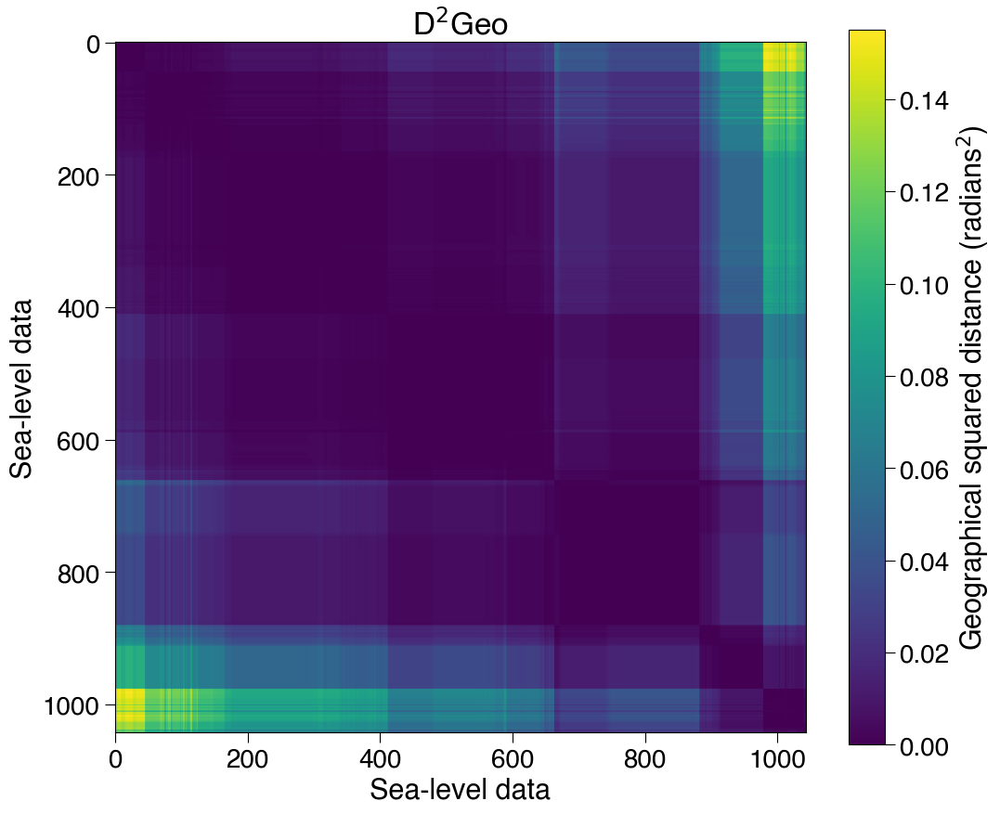

In [25]:
#calculate squared distance matrix
D_geo_sqaure = PSTHM.post.cal_geo_dist2(rsl_coord)

plt.figure(figsize=(12,10))
plt.imshow(D_geo_sqaure)
plt.colorbar(label='Geographical squared distance (radians$^2$)')
plt.xlabel('Sea-level data')
plt.ylabel('Sea-level data')
plt.title('D$^2$Geo');

**Spatial covariance matrix**

The next step is calculate sptial covariance matrix based on geographical squared distance function. Let's take RBF kernel as an example, which can now be written as:

$$
k_{RBF}(x,x') = \sigma^2\exp\left(-0.5 \times \frac{|x-x'|^2}{l^2}\right)
$$

where $|x-x'|^2$ denotes geographicalsquared distance between each pair of data point based on their coordinate. Let's try it, assumping $\sigma =1$ and $l =0.2$, where $l =0.2$ indicates a sea-level site can correlate with other sea-level sites within 1274 km (6371 x 0.2). Likewise, if $l$ is small, we expect a smaller nearby area to share a similar RSL variation pattern.

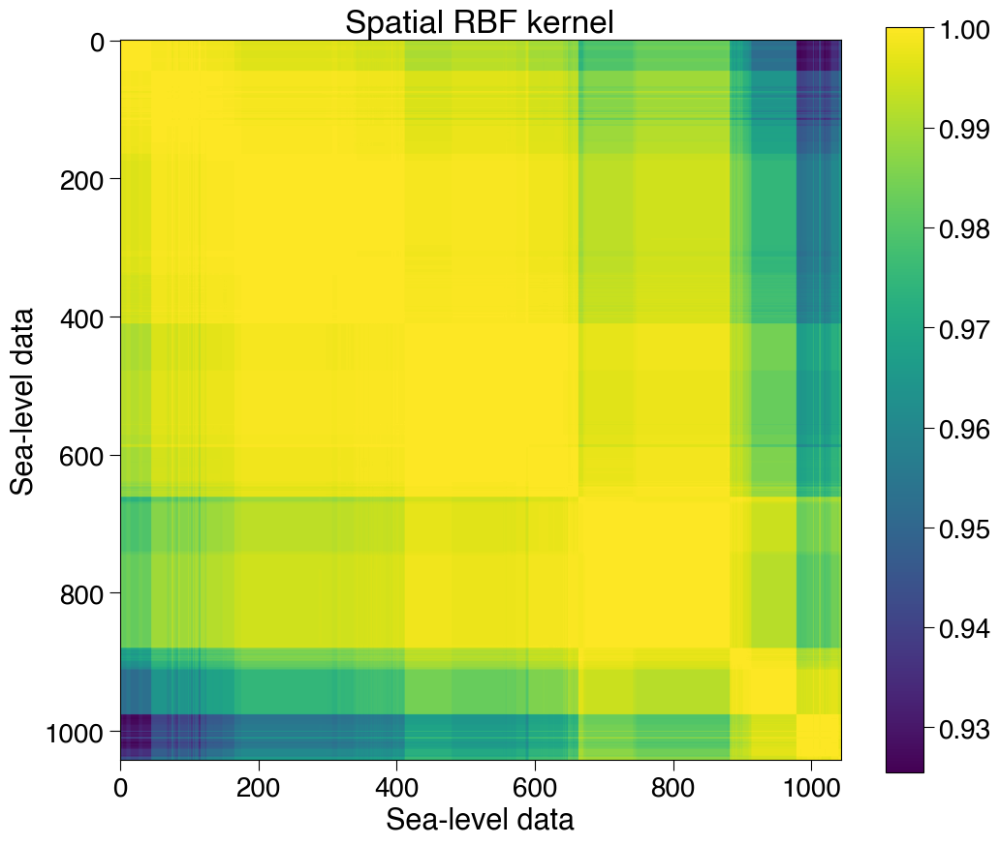

In [26]:
sigma_e = 1
l_e = 1
RBF_geo =  sigma_e**2 * torch.exp(-D_geo_sqaure/(2*l_e**2))

plt.figure(figsize=(12,10))
plt.imshow(RBF_geo)
plt.colorbar()
plt.xlabel('Sea-level data')
plt.ylabel('Sea-level data')
plt.title('Spatial RBF kernel');

**Spatio-temporal kernel**


Once we know how to construction a spatial kernel, the simplest way to couple it with a temporal kernel is:

$$
k_{RBF}(X,X') = \sigma^2 \exp\left(-0.5 \times \frac{|t-t'|^2}{l_{t}^2}\right) \times \exp\left(-0.5 \times \frac{|x-x'|^2}{l_{s}^2}\right)
$$

where $X$ is a data matrix contains age and geographical location of each data, $\sigma^2$ is a varaince hyperparameter that controls the variability of this covariance function. Note, we only need one variance hyperparameter for this spatio-temporal kernel instead of one for spatial and one for temporal. $l_{t}$ and $l_{s}$ are length scale hyperparameters that deteremines the temporal and spatial length scale of covariance function. Now, this STGP can be written as:

$$
p(f| \sigma, l_{t},l_{s} ,y) \sim GP(0,k_{RBF}(X,X'))
$$

Becuase we are constructing spatio-temporal kernel here, the input data should incorporate spatio-temporal information like:

| Age (CE)  | Laitude (degree) | Longitude (degree)  |
| :-: | :-: | :-: |
| -2576 | 44.629 | -67.382
| -2607 | 44.429 | -68.-1
| ... | ... | ...


Ok, let's try to build our first spatio-temporal kernel with PSTHM. You can build a spatial kernel in PSTHM by:

```python 
spatial_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,geo=True,s_lengthscale = torch.tensor(0.2))
```

By setting `geo=True`, the code can compute a RBF kernel for you based on geographical distance, s_lengthscale here indicates the scale lengthscale hyperparameter. 


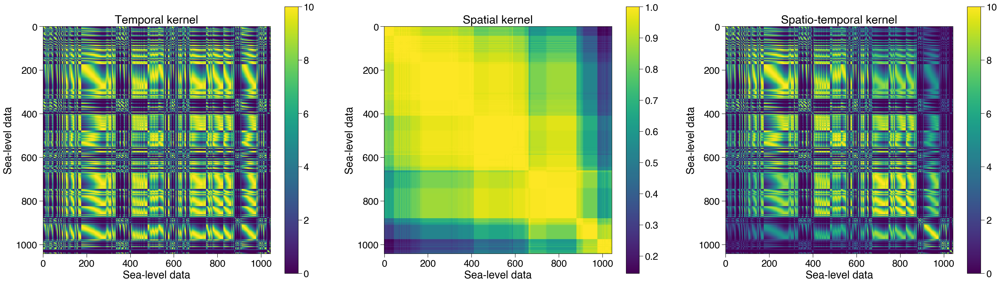

In [27]:
#define input matrix
X = torch.hstack([age[:,None],rsl_coord]) 

pyro.clear_param_store()
#construct spatial and temporal kernels
spatial_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,geo=True,s_lengthscale=torch.tensor(0.2))

temporal_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,geo=False,lengthscale=torch.tensor(1000.),variance=torch.tensor(10.))

#couple spatial and temporal kernels 
ST_RBF_kernel = PSTHM.kernels.Product(spatial_RBF_kernel, temporal_RBF_kernel)

#calculate spatio-temporal covariance matrix
T_co_matrix = temporal_RBF_kernel(X)
S_co_matrix = spatial_RBF_kernel(X)
ST_co_matrix = ST_RBF_kernel(X)

#plot covariance matrix
plt.figure(figsize=(36,10))
plt.subplot(1,3,1)
plt.imshow(T_co_matrix.detach().numpy())
plt.colorbar()
plt.xlabel('Sea-level data')
plt.ylabel('Sea-level data')
plt.title('Temporal kernel')

plt.subplot(1,3,2)
plt.imshow(S_co_matrix.detach().numpy())
plt.colorbar()
plt.xlabel('Sea-level data')
plt.ylabel('Sea-level data')
plt.title('Spatial kernel')

plt.subplot(1,3,3)
plt.imshow(ST_co_matrix.detach().numpy())
plt.colorbar()
plt.xlabel('Sea-level data')
plt.ylabel('Sea-level data')
plt.title('Spatio-temporal kernel');

You can see the resulting spaio-temporal kernel is influenced by both spatial and temporal kernel now. And then we can start to use this kernel to infer the spatio-temporal sea-level change by optimizing the hyperparameters of this kernel. Because when we do STGP, the data size tend to be much larger than temporal GP, meaning the computaitonal resources required is much larger as well. Therefore, we will use empirical Bayes method to make life easier. You can optimize STGP exactly the same as temporal GP in PSTHM. 

**P.S.** Each iteration for optimizing STGP is slower, so we can reasonably increase the learning rate to make it converge faster, so we can get an optimized model with less iterations. 

  0%|          | 0/200 [00:00<?, ?it/s]

Log Likelihood -4.308
Execution time: 28.143 s


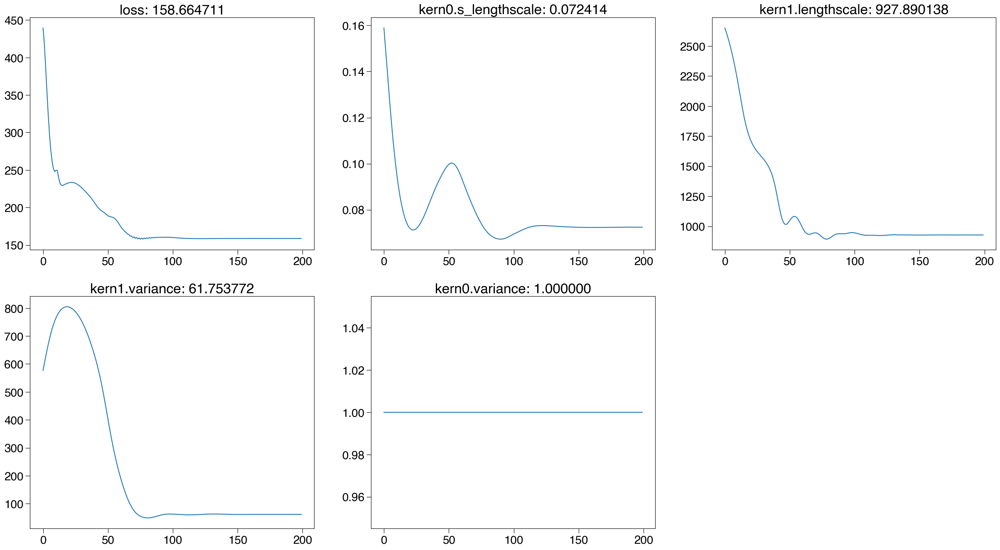

In [28]:
st = time.time() 
pyro.clear_param_store() 

#construct spatial and temporal kernels
spatial_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,geo=True)
#note the spatial lengthscale is called s_lengthscale in the PSTHM package
#you can time spatial lengthscale hyperparameter with 6371 to get the geographical distance in km
spatial_RBF_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.01), torch.tensor(0.3)))

temporal_RBF_kernel = PSTHM.kernels.RBF(input_dim=1,geo=False)
temporal_RBF_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(1.), torch.tensor(3000.)))
temporal_RBF_kernel.set_prior("variance", dist.Uniform(torch.tensor(1e-3), torch.tensor(1000.)))

#couple spatial and temporal kernels 
ST_RBF_kernel = PSTHM.kernels.Product(spatial_RBF_kernel, temporal_RBF_kernel)

#build a GP regressor with the combined kernel, assuming no chronological uncertainty
gpr = PSTHM.model.GPRegression_V(X, y, ST_RBF_kernel,noise=torch.tensor(y_sigma**2),jitter=1e-5)

#Empirical bayes optimization, default iteration is 1000
gpr,track_list = PSTHM.opti.SVI_NI_optm(gpr,x_sigma=age_sigma,num_iteration=200,lr=0.1,decay_r=0.8)

#predict RSL for each rsl data age 
pred_y,_ = gpr(gpr.X, full_cov=True) 

#calulate log likelihood of the model prediction
fit_likelihood = PSTHM.post.cal_likelihood(y.detach().numpy(),y_sigma.detach().numpy(),pred_y.detach().numpy())
print('Log Likelihood {:3.3f}'.format(fit_likelihood))
axes = PSTHM.plotting.plot_track_list(track_list)    
et = time.time() # get the end time

# get the execution time
elapsed_time = et - st
print('Execution time: {:3.3f} s'.format( elapsed_time))


Ok, it seems the hyperparameters are concerged pretty well, we can start to generate some inferences on spatio-temporal sea-level change now. To predict RSL, we need to provide an input matrix with the same format as the input data. Let's try to predict a temporal RSL variation for New Jersey first. 

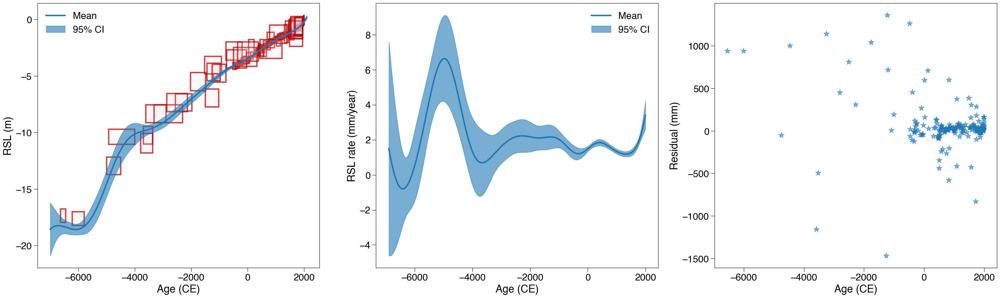

In [29]:
#generate prediction matrix
NJ_index = rsl_region==7
test_age = np.arange(-7000,2100,5)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
y_mean, y_var = gpr(pred_matrix.double(), full_cov=True)
y_std = y_var.diag().sqrt()
rsl_time,rsl_rate,rsl_rate_sd = PSTHM.post.cal_rate_var(test_age,y_var.detach().numpy(),y_mean.detach().numpy())

#plot the prediction
axes = PSTHM.plotting.plot_tem_regression(age[NJ_index],y[NJ_index],age_sigma[NJ_index],y_sigma[NJ_index],test_age,y_mean,y_std,
                          rsl_time,rsl_rate,rsl_rate_sd)


Seems not bad! Because we are using the RBF kernel, RSL changes quite smoothly here. Let's now try to predict spatial pattern of RSL. For sea-level study, visulising the sea-level change rate plot is often more meaningful compared with plotting a single time slice. So let's try plot RSL difference from 10000 to 6000 CE like Fig. 5 in [Ashe et al., 2019](https://www.sciencedirect.com/science/article/pii/S0277379118302130#fig5), which can tell us about the mean RSL between them, RSL change rate, and the uncertainty. 

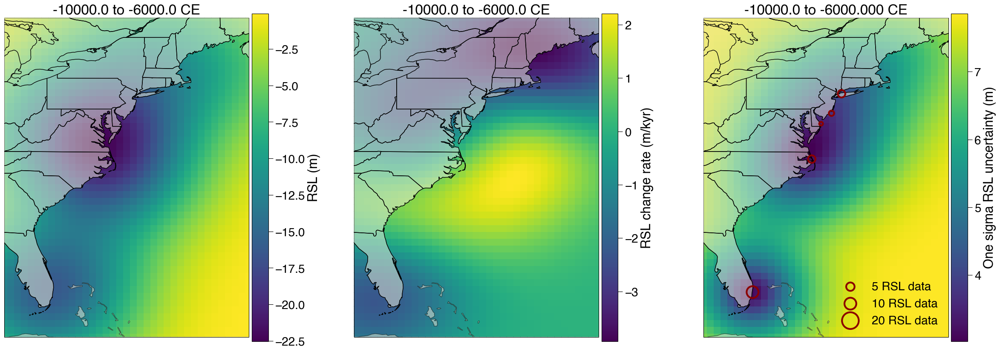

In [30]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-2,np.max(rsl_lon)+2,0.5)
#from 10000 to 8000 with 500 years interval, don't use over small time interval, otherwise the prediction will be very slow
#and the required RAM (random assess memeory) will be pretty large 
time_mat = np.arange(-10000,-5900,2000) 
pred_matrix = PSTHM.post.gen_pred_matrix(time_mat,lat_matrix,lon_matrix)
y_mean, y_var = gpr(pred_matrix, full_cov=True)

fig = PSTHM.plotting.plot_spatial_rsl_range(pred_matrix,y_mean,y_var,rsl_lon,rsl_lat,age,rsl_region,cmap='viridis',plot_site=True)

Now, based on spatio-temporal kernel, we can start to infer spatio-temporal properties of sea-level change. We can see that, the spatial predictions show higher precesion (low uncertainty) in locations where sea-level data reconstructed and it will gradually approach to mean function (which we use 0 here) for locations far away from data locations. 

Although this kernel function provides a reasonable performance on sea-level prediction, a single kernel function is too simple to capture complex physical behaviors. So in our next tutorial, we will use multiple kernels. You will learn how to do sea-level predictions with multiple kernels and how to sperate each kernel contribution to the final results.

## 6. Spatiotemporal Gaussian Process - kernel design and decomposition

We have introduced some popular kernels in GP regression along with different kernel combination methods for temporal GP. It is straightforawrd to extend it to STGP with the same method. With PSTHM, you can define a spatial kernel by setting `geo=True` and it currently supports the following kernels:

1. RBF

1. RationalQuadratic

1. Exponential

1. Matern21

1. Matern32

1. Matern52 


To illustrate it, let's try to use STGP with multiple kernels to infer post 1950 sea-level change pattern using tide gauage data (which essentially does not contain temporal uncertainty).

we use tide gauge data for  US Atlantic coast from [PSMSL](https://psmsl.org) (data downloaded at 07/26/2023). Because the original data are quite noisy, we appiled a few filters to find out data that at least cover 30 year time span and they should be active now. Also, we assume the last observation of RSL is 0, and readjust the data based on that reference point.  

Total number of data points:  3823


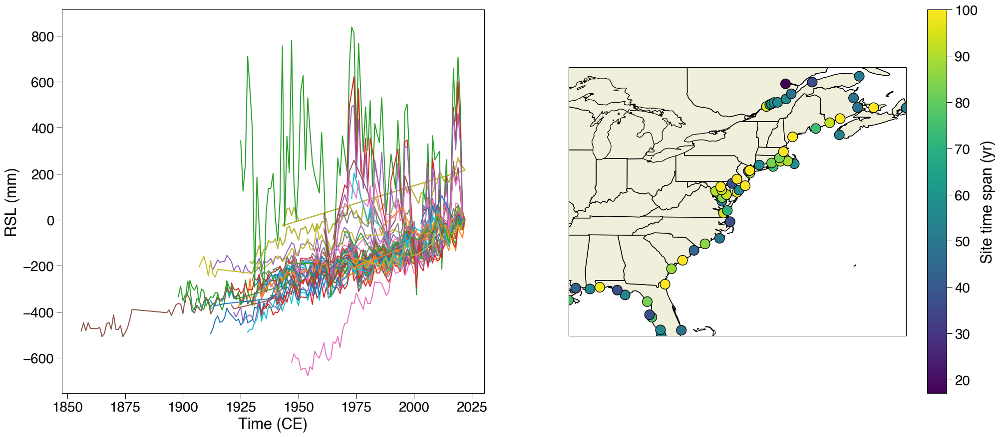

In [31]:
# #load the data, you need to define the region of interest, the minimum time span of the data, and selected data should contain data later than the latest age
US_AT_data = PSTHM.load.load_PSMSL_data('../../Data/TG_data',min_lat=25,max_lat=50,min_lon=-90,max_lon=-60,min_time_span=30,latest_age=2020)
US_site_coord = np.unique(US_AT_data.iloc[:,4:],axis=0)
TG_X = torch.tensor(np.vstack((US_AT_data.iloc[:,4],US_AT_data.iloc[:,5])).T)
TG_X = torch.hstack([torch.tensor(US_AT_data.iloc[:,:1].values),TG_X])
TG_y = torch.tensor(US_AT_data.iloc[:,1].values)
#-----------------plot the US Atlantic Coast RSL data-----------------
fig = plt.figure(figsize=(24,10))
gs = fig.add_gridspec(1, 2)

ax = fig.add_subplot(gs[0, :1])
for i in range(len(US_site_coord)):
    site_index = np.sum(US_AT_data.iloc[:,4:],axis=1) == np.sum(US_site_coord[i])
    ax.plot(US_AT_data[site_index].iloc[:,0],US_AT_data[site_index].iloc[:,1])
plt.xlabel('Time (CE)')
plt.ylabel('RSL (mm)')
#plot spatial data distribution, note that the size of the circle is proportional to the number of data points in the region
ax2 = fig.add_subplot(gs[0, 1:2], projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(US_site_coord[:,1]),np.max(US_site_coord[:,1]),np.min(US_site_coord[:,0]),np.max(US_site_coord[:,0])])
site_time_length = []
for i in range(len(US_site_coord)):
    site_index = np.sum(US_AT_data.iloc[:,4:],axis=1) == np.sum(US_site_coord[i])
    site_time_length.append(np.max(US_AT_data[site_index].iloc[:,0])-np.min(US_AT_data[site_index].iloc[:,0]))
ax2.scatter(US_site_coord[10,1],US_site_coord[10,0],s=200,color='r')
im = ax2.scatter(US_site_coord[:,1],US_site_coord[:,0],c= site_time_length,
            s=200,transform=ccrs.PlateCarree(),zorder=1,vmax=100,cmap='viridis',ec='k')
plt.colorbar(im,label='Site time span (yr)')
print('Total number of data points: ',len(TG_y));

From the plots above, you can clearly see some RSL change variability across different locations. To infer the spatio-temporal RSL change pattern based on this data, here we characterize the RSL change process with three GP kernels:

$$
k_{combined}(X,X') = k_{global}(t,t')+ k_{linear}(X,X')+k_{nonlin}(X,X')
\\

k_{global}(t,t') = k_{M3}(t,t')
\\

k_{linear}(X,X') = k_{Linear}(t,t') \times k_{M5}(x,x')
\\

k_{nonlin}(X,X') = k_{M3}(t,t') \times k_{M5}(x,x')
$$

where X indicates a data matrix contains age and coordinate of each data, with t representing the age and x representing the coordinate. `k` indicates the kernel (or covariance function) with $k_{Linear}$, $k_{M3}$ and $k_{M5}$ denotes linear, 3/2 Matérn and 5/2 Matérn kernels, respectively. This is a common way to describe spatio-temporal RSL process as in [Kopp et al., (2014)](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1002/2014EF000239), [Kopp et al., (2016)](https://www.pnas.org/doi/abs/10.1073/pnas.1517056113). 


Now even we only consider Atlantic coast data, we have 3800+ data, so the calculation can be pretty slow (200 iterations took me 8 mintues on a fairly good desktop). Let's try to do it here.

**P.S.** The default code does not train the model, instead, it will load the trained model, which is much faster. If you want to try to train it on your own computer, just de-comment the code.

In [32]:
st = time.time() 
pyro.clear_param_store()
#define global temporal kernel
global_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
global_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(10.), torch.tensor(1000.)))
global_kernel.set_prior("variance", dist.Uniform(torch.tensor(10.**2), torch.tensor(1000000.)))

#define regionally linar spatio-temporal kernel
regional_linear_temporal_kernel = PSTHM.kernels.Linear(input_dim=1)
regional_linear_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(1e-12), torch.tensor(10.)))
regional_linear_temporal_kernel.ref_year = 2000
regional_linear_spatial_kernel = PSTHM.kernels.Matern52(input_dim=1,geo=True)
regional_linear_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.03), torch.tensor(0.3)))
regional_linear_kernel = PSTHM.kernels.Product(regional_linear_temporal_kernel, regional_linear_spatial_kernel)

#define regionally non-linar spatio-temporal kernel
regional_nl_temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
regional_nl_temporal_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(5.), torch.tensor(5000.)))
regional_nl_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.03), torch.tensor(40.**2)))
regional_nl_spatial_kernel = PSTHM.kernels.Matern52(input_dim=1,geo=True)
regional_nl_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.03), torch.tensor(0.3)))
regional_nl_kernel = PSTHM.kernels.Product(regional_nl_temporal_kernel, regional_nl_spatial_kernel)

white_noise_kernel = PSTHM.kernels.WhiteNoise(input_dim=1)
white_noise_kernel.set_prior("variance", dist.Uniform(torch.tensor(1.), torch.tensor(100.)))

combined_sp_kernel = PSTHM.kernels.Sum(global_kernel,regional_linear_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,regional_nl_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,white_noise_kernel)

#-----------------define the model-----------------
#If you don't set the noise, the model will automatically estimate the noise as the last hyperparameter
#If so, there's no constraint on the noise hyperparameter value. 
#It is more recomended to set noise value by a whitenoise kernel as above
gpr = PSTHM.model.GPRegression_V(TG_X, TG_y, combined_sp_kernel,noise=torch.tensor(0.))

# #Empirical bayes optimization, default iteration is 1000
# gpr,track_list = PSTHM.opti.SVI_optm(gpr,lr=0.5,num_iteration=50)

# axes = PSTHM.plotting.plot_track_list(track_list)
# et = time.time() # get the end time

# # get the execution time
# elapsed_time = et - st
# print('Execution time: {:3.3f} s'.format(elapsed_time))

# #----Save and load the trained model----
# pyro.get_param_store().save("../../Trained_Models/TG_SP_model.pt")
pyro.get_param_store().load("../../Trained_Models/TG_SP_model.pt")


Let's check the STGP predictions as we did before.

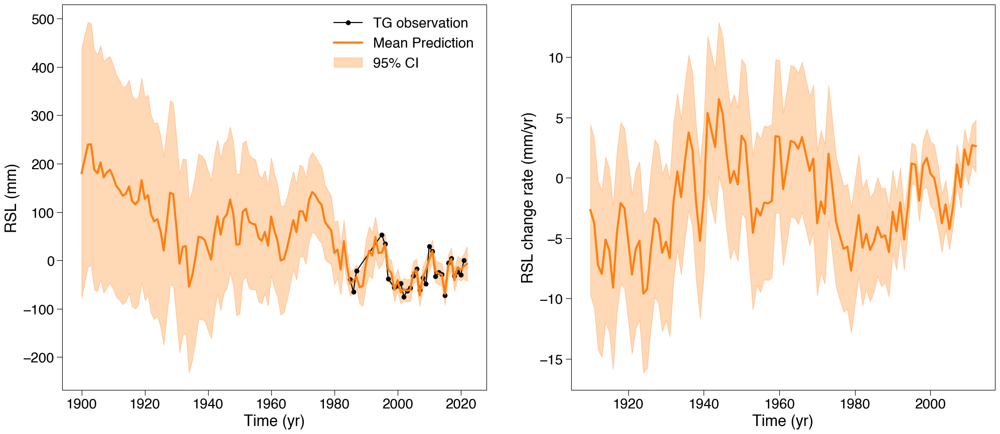

In [33]:
#generate prediction matrix
site = 61
site_index = np.sum(US_AT_data.iloc[:,4:],axis=1) == np.sum(US_site_coord[site])
test_age = np.arange(1900,2023,1)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,US_site_coord[site][0],US_site_coord[site][1])
y_mean, y_var = gpr(pred_matrix.double(), full_cov=True)
y_std = y_var.diag().sqrt()
rsl_time,rsl_rate,rsl_rate_sd = PSTHM.post.cal_rate_var(test_age,y_var.detach().numpy(),y_mean.detach().numpy(),difftimestep=20)

#plot the prediction
fig = plt.figure(figsize=(24,10))
plt.subplot(121)
plt.plot(US_AT_data[site_index].iloc[:,0],US_AT_data[site_index].iloc[:,1],'ko-',label='TG observation')
plt.plot(test_age,y_mean.detach().numpy(),color='C1',linewidth=3,label='Mean Prediction')
plt.fill_between(test_age,y_mean.detach().numpy()-2*y_std.detach().numpy(),y_mean.detach().numpy()+2*y_std.detach().numpy(),color='C1',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (mm)')
plt.legend()
plt.subplot(122)
plt.plot(rsl_time,rsl_rate,'C1',linewidth=3,label='Mean Prediction')
plt.fill_between(rsl_time,rsl_rate-2*rsl_rate_sd,rsl_rate+2*rsl_rate_sd,color='C1',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL change rate (mm/yr)');


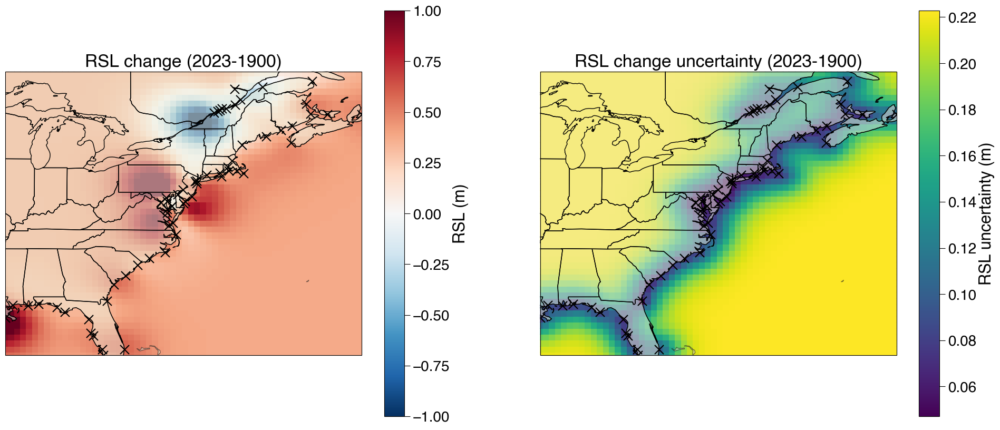

In [34]:
lat_matrix = np.arange(np.min(US_site_coord[:,0])-2,np.max(US_site_coord[:,0])+2,0.5)
lon_matrix = np.arange(np.min(US_site_coord[:,1])-2,np.max(US_site_coord[:,1])+2,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
pred_matrix = PSTHM.post.gen_pred_matrix([2023],lat_matrix,lon_matrix)
pred_matrix2 = PSTHM.post.gen_pred_matrix([1900],lat_matrix,lon_matrix)

y_mean, y_var = gpr(pred_matrix, full_cov=True)
y_mean2, y_var2 = gpr(pred_matrix2, full_cov=True)

y_std = y_var.diag().sqrt()
y_std2 = y_var2.diag().sqrt()

plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(US_site_coord[:,1]),np.max(US_site_coord[:,1]),np.min(US_site_coord[:,0]),np.max(US_site_coord[:,0])])
im = ax2.pcolor(lon_mat,lat_mat,(y_mean-y_mean2).detach().numpy().reshape(lat_mat.shape)/1000,cmap='RdBu_r',zorder=-1,
                vmax=1,vmin=-1)
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('RSL change (2023-1900)')

ax2.scatter(US_site_coord[:,1],US_site_coord[:,0],c='k',s=150,marker='x',label='TG observation')

ax2 = plt.subplot(122,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(US_site_coord[:,1]),np.max(US_site_coord[:,1]),np.min(US_site_coord[:,0]),np.max(US_site_coord[:,0])])
ax2.scatter(US_site_coord[:,1],US_site_coord[:,0],c='k',s=150,marker='x',label='TG observation')

im = ax2.pcolor(lon_mat,lat_mat,((y_std+y_std2)/2).detach().numpy().reshape(lat_mat.shape)/1000,cmap='viridis',zorder=-1)
plt.colorbar(im,ax=ax2,label='RSL uncertainty (m)')
plt.title('RSL change uncertainty (2023-1900)');

It seems like our STGP predict the largest variability in New York State where former North American Ice Sheet boundary located at. AS we consider a linear and an non-linear spatial kernel, it would be good to understand each kernel's contribution to this variability.

**Spatio-temporal kernel decomposition**


A good thing about using different spatio-temporal GP kernels is that we can actually decompose the spatial temporal signal, which is a powerful tool to interpret sea-level change pattern

You can do this simply in PSTHM with function `PSTHM.decompose_kernels`, where you can put in the GP regression object along with a predcition_matrix, which specific the time and location you want to decompose the kernel. And lastly, this function requires a list of kernels you want to decompose.

In this case, each spatio-temporal or temporal kernel's effect on sea-level change can be isolated. Let's start with decompose temporal singal.

In [35]:
site = 61
site_index = np.sum(US_AT_data.iloc[:,4:],axis=1) == np.sum(US_site_coord[site])
test_age = np.arange(1900,2023,1)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,US_site_coord[site][0],US_site_coord[site][1])

y_mean, y_var = gpr(pred_matrix, full_cov=True)

#-----------------define the kernel to decompose-----------------
global_kernel = gpr.kernel.kern0.kern0.kern0
regional_linear_kernel = gpr.kernel.kern0.kern0.kern1
regional_nl_kernel = gpr.kernel.kern0.kern1

#-----------------decompose the kernel-----------------
global_dep,reigonal_linear_dep,regional_nl_dep = PSTHM.post.decompose_kernels(gpr,pred_matrix,[global_kernel,regional_linear_kernel,regional_nl_kernel])
global_mean,global_var = global_dep
global_std = global_var.diag().sqrt()

regional_linear_mean,regional_linear_var = reigonal_linear_dep
regional_linear_std = regional_linear_var.diag().sqrt()

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_std = regional_nl_var.diag().sqrt()

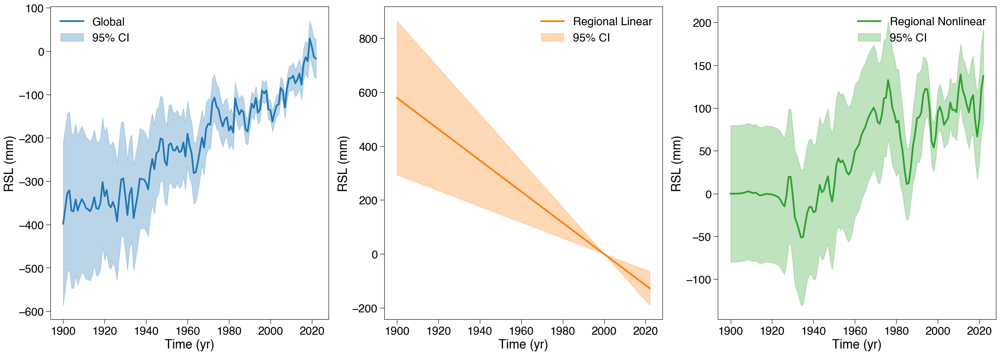

In [36]:
plt.figure(figsize=(30,10))
plt.subplot(131)
plt.plot(test_age,global_mean.detach().numpy(),'C0',linewidth=3,label='Global')
plt.fill_between(test_age,global_mean.detach().numpy()-2*global_std.detach().numpy(),global_mean.detach().numpy()+2*global_std.detach().numpy(),color='C0',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (mm)')
plt.legend()
plt.subplot(132)
plt.plot(test_age,regional_linear_mean.detach().numpy(),'C1',linewidth=3,label='Regional Linear')
plt.fill_between(test_age,regional_linear_mean.detach().numpy()-2*regional_linear_std.detach().numpy(),regional_linear_mean.detach().numpy()+2*regional_linear_std.detach().numpy(),color='C1',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (mm)')
plt.legend()
plt.subplot(133)
plt.plot(test_age,regional_nl_mean.detach().numpy(),'C2',linewidth=3,label='Regional Nonlinear')
plt.fill_between(test_age,regional_nl_mean.detach().numpy()-2*regional_nl_std.detach().numpy(),regional_nl_mean.detach().numpy()+2*regional_nl_std.detach().numpy(),color='C2',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (mm)')
plt.legend();

By decomposing three different components, we can tell more stories about RSL change at this specific tide gauge sites in western Florida, where most of RSL change here can be explained by a global component (i.e., shared component for every site) showing continuous RSL change perhaps due to themosteric effect, global ice sheet/glacier melting etc. 

The regional linear is quite minor here while the regional non-linear component is 

Decompose spatial field of RSL change is pretty much the same as temporal field. As all tide gauge sites share the same global component, we don't need to decompose that for spatial field. Therefore, let's just predict the spatial RSL change between 1900 and 2020 for regional linear and regional non-linear GP kernels. 


In [37]:
lat_matrix = np.arange(np.min(US_site_coord[:,0])-2,np.max(US_site_coord[:,0])+2,0.5) # 0.5 degree spatial resolution
lon_matrix = np.arange(np.min(US_site_coord[:,1])-2,np.max(US_site_coord[:,1])+2,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
pred_matrix = PSTHM.post.gen_pred_matrix([2020],lat_matrix,lon_matrix)
pred_matrix2 = PSTHM.post.gen_pred_matrix([1950],lat_matrix,lon_matrix)
y_mean, y_var = gpr(pred_matrix, full_cov=True)

#-----------------define the kernel to decompose-----------------
global_kernel = gpr.kernel.kern0.kern0.kern0
regional_linear_kernel = gpr.kernel.kern0.kern0.kern1
regional_nl_kernel = gpr.kernel.kern0.kern1

#-----------------decompose the kernel-----------------
reigonal_linear_dep,regional_nl_dep = PSTHM.post.decompose_kernels(gpr,pred_matrix,[regional_linear_kernel,regional_nl_kernel])
reigonal_linear_dep2,regional_nl_dep2 = PSTHM.post.decompose_kernels(gpr,pred_matrix2,[regional_linear_kernel,regional_nl_kernel])

regional_linear_mean,regional_linear_var = reigonal_linear_dep
regional_linear_mean2,regional_linear_var2 = reigonal_linear_dep2
regional_linear_std = regional_linear_var.diag().sqrt()
regional_linear_std2 = regional_linear_var2.diag().sqrt()

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_mean2,regional_nl_var2 = regional_nl_dep2
regional_nl_std = regional_nl_var.diag().sqrt()
regional_nl_std2 = regional_nl_var2.diag().sqrt()

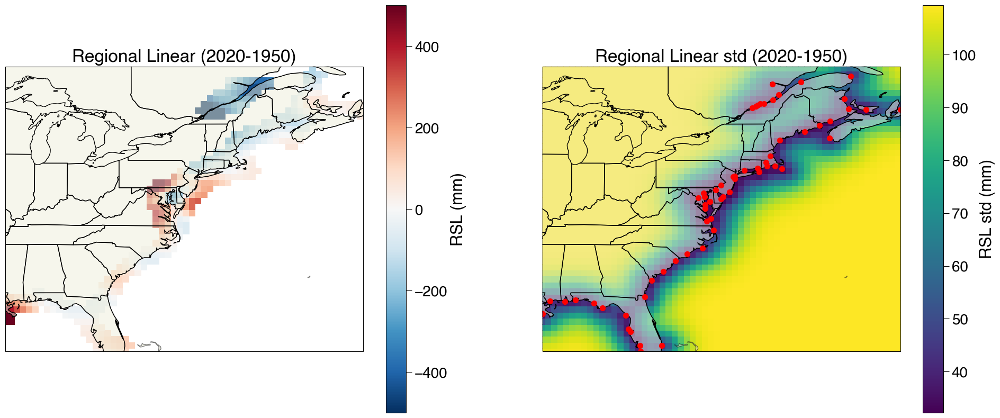

In [38]:
plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(US_site_coord[:,1]),np.max(US_site_coord[:,1]),np.min(US_site_coord[:,0]),np.max(US_site_coord[:,0])])
masked_rate = np.ma.masked_array((regional_linear_mean-regional_linear_mean2).detach().numpy(),(((regional_linear_std+regional_linear_std2)/2).detach().numpy()/2)>30)
im = ax2.pcolor(lon_mat,lat_mat,masked_rate.reshape(lat_mat.shape),cmap='RdBu_r',zorder=-1,
                vmax=500,vmin=-500)
plt.colorbar(im,ax=ax2,label='RSL (mm)')
plt.title('Regional Linear (2020-1950)')

# ax2.scatter(US_site_coord[:,1],US_site_coord[:,0],c='k',s=50,marker='o',label='TG observation')

ax2 = plt.subplot(122,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.set_extent([np.min(US_site_coord[:,1]),np.max(US_site_coord[:,1]),np.min(US_site_coord[:,0]),np.max(US_site_coord[:,0])])
ax2.scatter(US_site_coord[:,1],US_site_coord[:,0],c='r',s=50,marker='o',label='TG observation')

im = ax2.pcolor(lon_mat,lat_mat,((regional_linear_std+regional_linear_std2)/2).detach().numpy().reshape(lat_mat.shape),cmap='viridis',zorder=-1)
plt.colorbar(im,ax=ax2,label='RSL std (mm)')
plt.title('Regional Linear std (2020-1950)');

### 7. Spatiotemporal Gaussian Process - interaction with physics based models


As in tutorial, we will use sea-level data from Ashe et al., (2019, and references therein) to infer spatio-temporal sea-level change pattern. Unlike tutorial 8 that used a single ST kernel, we will use multiple ST kernels here to decompose different physical processes contribution to sea-level change.


We will use a global temporal kernel, a regionally linear ST kernel, a regional non-linear ST kernel, a locally non-linear ST kernel and a whitenoise kernel. We can write it down as:

$$
p(f| \Theta_{s},f ) \sim GP(0,k_{combined}(X,X')) \\
k_{combined}(X,X') = k_{global}(t,t') + k_{regionL}(X,X')  + k_{regionNL}(X,X') + k_{localNL}(X,X') + k_{whitenoise}(X,X')$$
where $X$ indicates time and location of each sea-level data, consisting time ($t$) and location ($x$). Each specific kernel can be expressed as: 
$$
k_{global}(t,t') = k_{M_{32}}(t,t')\\
k_{regionL}(X,X') = k_{Linear}(t,t') \cdot k_{RBF}(x,x')\\
k_{regionNL}(X,X') = k_{M_{52}}(t,t') \cdot k_{M_{32}}(x,x')\\
k_{localNL}(X,X') = k_{M_{32}}(t,t') \cdot k_{M_{32}}(x,x')\\
k_{whitenoise}(X,X') = k_{whitenose}(X,X')\\
$$
where $\cdot$ indicates element-wise multiplication. The difference between regional and local non-linear kernel is specified by different choices in kernels and prior distribtuions. 

**P.S.** 

1. The default code does not train the model, instead, it will load the trained model, which is much faster. If you want to try to train it on your own computer, just de-comment the code. 

2. To use GPU to accelerate the training process with `SVI_NI_optm` function, we need to specific `gpu==True` as well. 

In [24]:
import time

st = time.time() 

pyro.clear_param_store()
#define global temporal kernel as a Matern32
global_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
global_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(100.), torch.tensor(20000.)))
global_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.01**2), torch.tensor(1000.)))

#define regionally non-linar spatio-temporal kernel
regional_nl_temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
regional_nl_temporal_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(500.), torch.tensor(5000.)))
regional_nl_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.05), torch.tensor(100.)))
regional_nl_spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
regional_nl_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.05), torch.tensor(0.25)))
regional_nl_kernel = PSTHM.kernels.Product(regional_nl_temporal_kernel, regional_nl_spatial_kernel)

#define locally non-linar spatio-temporal kernel
local_nl__temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
local_nl__temporal_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(100.), torch.tensor(2000.)))
local_nl__temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.1**2), torch.tensor(10.)))
local_nl__spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
local_nl__spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.01), torch.tensor(0.05)))
local_nl_kernel = PSTHM.kernels.Product(local_nl__temporal_kernel, local_nl__spatial_kernel)

#define whitenoise kernel
whitenoise_kernel = PSTHM.kernels.WhiteNoise(input_dim=1)
whitenoise_kernel.set_prior('variance',dist.Uniform(torch.tensor(0.01**2),torch.tensor(100.)))

#combine all kernels
combined_sp_kernel = PSTHM.kernels.Sum(regional_nl_kernel,local_nl_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,whitenoise_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,global_kernel)

gpr_1 = PSTHM.model.GPRegression_V(X, y, combined_sp_kernel,noise=torch.tensor(y_sigma**2),jitter=1e-5)

#Empirical bayes optimization, default iteration is 1000
# gpr,track_list = PSTHM.opti.SVI_NI_optm(gpr,x_sigma=age_sigma,num_iteration=150,lr=0.2,decay_r = 0.8,step_size=50)

# axes = PSTHM.plotting.plot_track_list(track_list)


# et = time.time() # get the end time

# # get the execution time
# elapsed_time = et - st
# print('Execution time: {:3.3f} s'.format( elapsed_time))

# # ----Save and load the trained model----
# pyro.get_param_store().save("../../Trained_Models/Holocene_SP_model.pt")

#-----------Load traniend model and plot the result----------------
pyro.get_param_store().load("../../Trained_Models/Holocene_SP_model.pt")


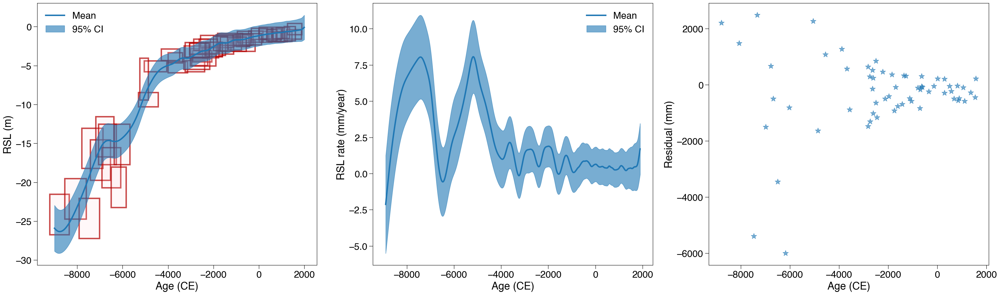

In [25]:
#generate prediction matrix
NJ_index = rsl_region==15
test_age = np.arange(-9000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
y_mean_1, y_var_1 = gpr_1(pred_matrix.double(), full_cov=True)
y_std_1 = y_var_1.diag().sqrt()
rsl_time,rsl_rate,rsl_rate_sd = PSTHM.post.cal_rate_var(test_age,y_var_1.cpu().detach().numpy(),y_mean_1.cpu().detach().numpy())

#plot the prediction
axes = PSTHM.plotting.plot_tem_regression(age[NJ_index],y[NJ_index],age_sigma[NJ_index],y_sigma[NJ_index],test_age,y_mean_1.detach().numpy(),y_std_1.detach().numpy(),
                          rsl_time,rsl_rate,rsl_rate_sd )


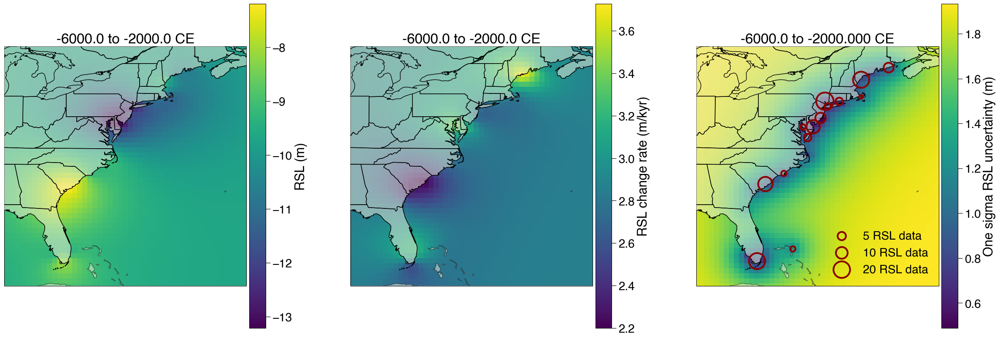

In [26]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
#from 10000 to 8000 with 500 years interval, don't use over small time interval, otherwise the prediction will be very slow
#and the required RAM will be pretty large 
time_mat = np.arange(-6000,-1900,4000) 
pred_matrix = PSTHM.post.gen_pred_matrix(time_mat,lat_matrix,lon_matrix)

y_mean, y_var = gpr_1(pred_matrix, full_cov=True)
pred_matrix_2 = PSTHM.post.gen_pred_matrix([-5500],lat_matrix,lon_matrix)
y_mean_spa_1, y_var_spa_1 = gpr_1(pred_matrix_2, full_cov=True)
y_std_spa_1 = y_var_spa_1.diag().sqrt()
fig = PSTHM.plotting.plot_spatial_rsl_range(pred_matrix,y_mean,y_var,rsl_lon,rsl_lat,age,rsl_region,cmap='viridis',plot_site=True)


**Kernel decompositions**

In [42]:
NJ_index = rsl_region==15
test_age = np.arange(-10000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
y_mean, y_var = gpr_1(pred_matrix, full_cov=True)

#-----------------define the kernel to decompose-----------------
global_kernel = gpr_1.kernel.kern1
regional_nl_kernel = gpr_1.kernel.kern0.kern0.kern0
local_nl_kernel = gpr_1.kernel.kern0.kern0.kern1

#-----------------decompose the kernel-----------------
global_dep,regional_nl_dep,local_nl_dep = PSTHM.post.decompose_kernels(gpr_1,pred_matrix,[global_kernel,regional_nl_kernel,local_nl_kernel])
global_mean,global_var = global_dep
global_std = global_var.diag().sqrt()

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_std = regional_nl_var.diag().sqrt()

local_nl_mean,local_nl_var = local_nl_dep
local_nl_std = local_nl_var.diag().sqrt()


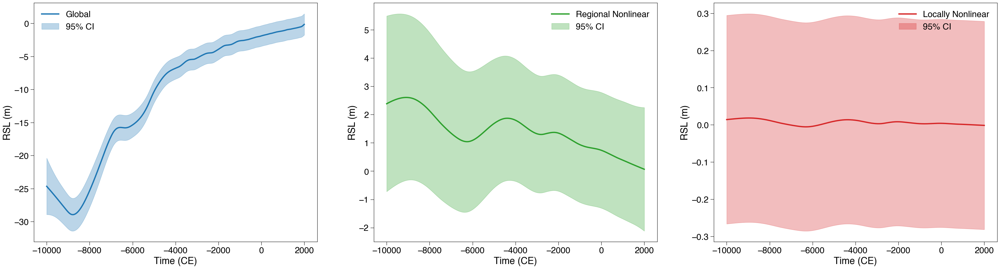

In [43]:
plt.figure(figsize=(40,10))
ax = plt.subplot(131)
plt.plot(test_age,global_mean.detach().numpy(),'C0',linewidth=3,label='Global')
plt.fill_between(test_age,global_mean.detach().numpy()-2*global_std.detach().numpy(),global_mean.detach().numpy()+2*global_std.detach().numpy(),color='C0',alpha=0.3,label='95% CI')

plt.xlabel('Time (CE)')
plt.ylabel('RSL (m)')
plt.legend()
plt.subplot(132)
plt.plot(test_age,regional_nl_mean.detach().numpy(),'C2',linewidth=3,label='Regional Nonlinear')
plt.fill_between(test_age,regional_nl_mean.detach().numpy()-2*regional_nl_std.detach().numpy(),regional_nl_mean.detach().numpy()+2*regional_nl_std.detach().numpy(),color='C2',alpha=0.3,label='95% CI')
plt.xlabel('Time (CE)')
plt.ylabel('RSL (m)')
plt.legend()
plt.subplot(133)
plt.plot(test_age,local_nl_mean.detach().numpy(),'C3',linewidth=3,label='Locally Nonlinear')
plt.fill_between(test_age,local_nl_mean.detach().numpy()-2*local_nl_std.detach().numpy(),local_nl_mean.detach().numpy()+2*local_nl_std.detach().numpy(),color='C3',alpha=0.3,label='95% CI')
plt.xlabel('Time (CE)')
plt.ylabel('RSL (m)')
plt.legend();

In [44]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
pred_matrix = PSTHM.post.gen_pred_matrix([-10000],lat_matrix,lon_matrix)
pred_matrix2 = PSTHM.post.gen_pred_matrix([2000],lat_matrix,lon_matrix)

#-----------------define the kernel to decompose-----------------
global_kernel = gpr_1.kernel.kern1
regional_nl_kernel = gpr_1.kernel.kern0.kern0.kern0
local_nl_kernel = gpr_1.kernel.kern0.kern0.kern1

#-----------------decompose the kernel-----------------
regional_nl_dep,local_nl_dep = PSTHM.post.decompose_kernels(gpr_1,pred_matrix,[regional_nl_kernel,local_nl_kernel])
regional_nl_dep2,local_nl_dep2 = PSTHM.post.decompose_kernels(gpr_1,pred_matrix2,[regional_nl_kernel,local_nl_kernel])

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_mean2,regional_nl_var2 = regional_nl_dep2
regional_nl_std = regional_nl_var.diag().sqrt()
regional_nl_std2 = regional_nl_var2.diag().sqrt()

local_nl_mean,locall_nl_var = local_nl_dep
local_nl_mean2,local_nl_var2 = local_nl_dep2
local_nl_std = local_nl_var.diag().sqrt()
local_nl_std2 = local_nl_var2.diag().sqrt()


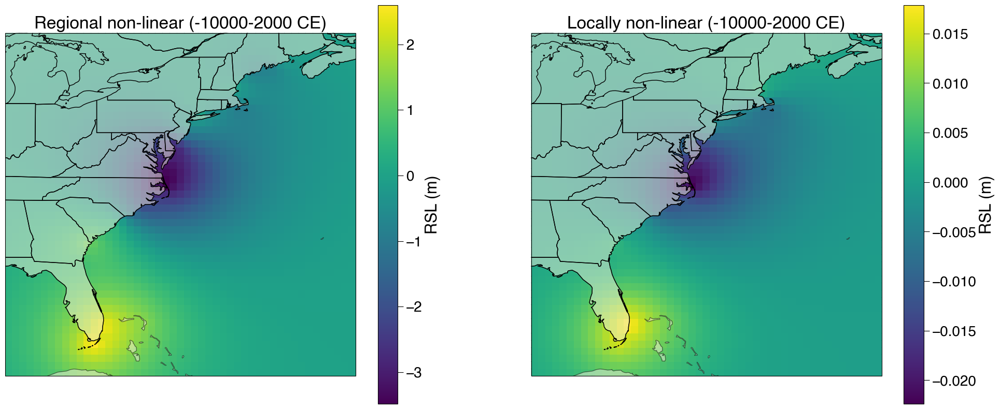

In [45]:
plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)

im = ax2.pcolor(lon_mat,lat_mat,(regional_nl_mean-regional_nl_mean2).detach().numpy().reshape(lat_mat.shape),zorder=-1)
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('Regional non-linear (-10000-2000 CE)')

ax2 = plt.subplot(122,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)

im = ax2.pcolor(lon_mat,lat_mat,(local_nl_mean-local_nl_mean2).detach().numpy().reshape(lat_mat.shape),zorder=-1)
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('Locally non-linear (-10000-2000 CE)');

By decomposing different STGP kernels, we can start to identify some phyiscal processes of postglacial sea-level change. We can see that regional linear kernel cause sea-level fall in the north and sea-level rise in the south, which can relate to glacial isostatic adjustment, tectonic and sediment compaction. The regional and locally non-linear terms usually used to describe ocean/atmosphere dynamics and static equilibrium “fingerprint” effects. 

**STGP with a single physical model for Holocene sea-level data**

As suggested by many paleo sea-level studies that the majority of sea-level change from the Last Glacial Maximum (~21,000 years ago) can be explained by ice-ocean mass exchange induced gravitational, rotational and deformational (GRD) effects on sea-level change, whcih can be modelled by a glacial isostatic adjustment (GIA) model. 

In this case, we can write our model as:
$$
p(f| \Theta_{s},\Theta_{g},f) \sim GP(GIA(X| \Theta_{g}),k_{combined}(X,X'))
$$
where $\Theta_{g}$ indicates GIA model parameters, including global ice history and Earth rheology; and GIA(X) indicates GIA model output for specific location and time, which can be interpreted as a interpolation function producing sea-level predictions for any given location and time. 

Let's try to predict sea level based on ICE_7G ice model as VM5 Earth rheology model, which can be downloaded [here](https://www.atmosp.physics.utoronto.ca/~peltier/data.php). You can see the GIA model prediction on global sea level on the figure below. Based on physical simulation, we can see more pattern of sea-level change for regional far-away from sea-level data. Although physical model can predict global sea level, the predicted sea-level can also fail to explain the observed sea-level data due to missing physical law, under constrained physical parameters etc... This can be evident when we check the data-model misfit in the right figure below.


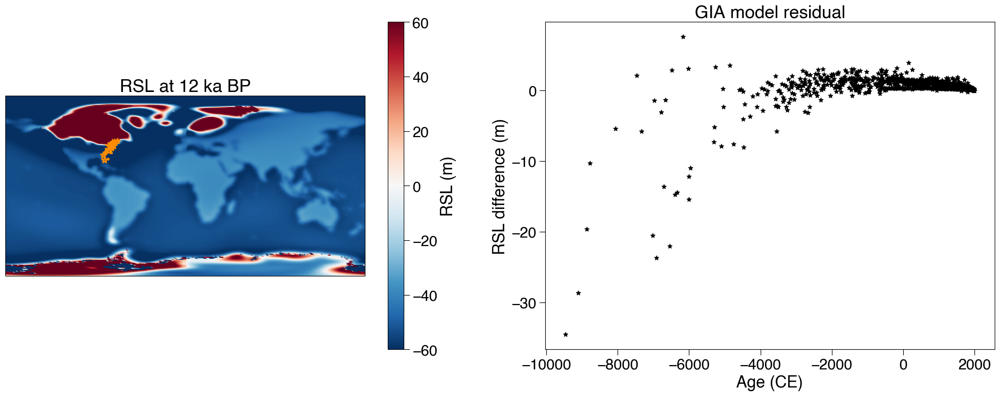

In [27]:
X = torch.hstack([age[:,None],rsl_coord]) 
lat = np.arange(-89.5,90,1)
lon = np.arange(0.5,360,1)
times = np.arange(0,13)
lon_matrix_GIA,lat_matrix_GIA = np.meshgrid(lon,lat)
ice7g_rsl = np.load('../3.ST_GP/ice7g_rsl.npy')
#select which time to visualize
time_index = 12
#-------Interpolate GIA model to RSL locations
from scipy.interpolate import RegularGridInterpolator as rgi
#transfer GIA model age to CE
time_CE = -(times*1000-1950)+67
time_mat,lat_mat,lon_mat = np.meshgrid(time_CE,lat,lon)
#interpolate GIA model
ice7g_interp = rgi((time_CE[::-1],lat,lon), ice7g_rsl[::-1])
#transfer longitude from -180-180 to 0-360
X_new = torch.clone(X)
X_new[:,2]+=360
ice7g_pred = ice7g_interp(X_new)

#---------------------------------------------------------
fig = plt.figure(figsize=(24,8))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())

im = ax2.scatter(lon_matrix_GIA,lat_matrix_GIA,c = ice7g_rsl[time_index],cmap='RdBu_r',zorder=0,vmax = 60,vmin=-60)
ax2.scatter([np.mean(rsl_lon[x]) for x in rsl_region_index], [np.mean(rsl_lat[x]) for x in rsl_region_index],
           transform=ccrs.PlateCarree(),s=[len(x)*1 for x in rsl_region_index],marker='*',facecolor='none',ec='darkorange',
           linewidth=2)
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('RSL at {:} ka BP'.format(time_index))

plt.subplot(122)
plt.scatter(X_new[:,0],ice7g_pred-y.cpu().detach().numpy(),c='k',marker='*')
plt.xlabel('Age (CE)')
plt.ylabel('RSL difference (m)')
plt.title('GIA model residual');

In this case, we can use use GP model based on a physical model to improve the performance of paleo sea-level. To implement GP with a single GIA model, we are essentially training the GP model with the GIA model residual (instead of original RSL data). As GIA model can be used to describe global and regional linear trend, we can re-write our combined kernel to:
$$
k_{combined}(X,X') = k_{regionNL}(X,X') + k_{localNL}(X,X') + k_{whitenoise}(X,X')
$$

  0%|          | 0/200 [00:00<?, ?it/s]

Execution time: 59.158 s


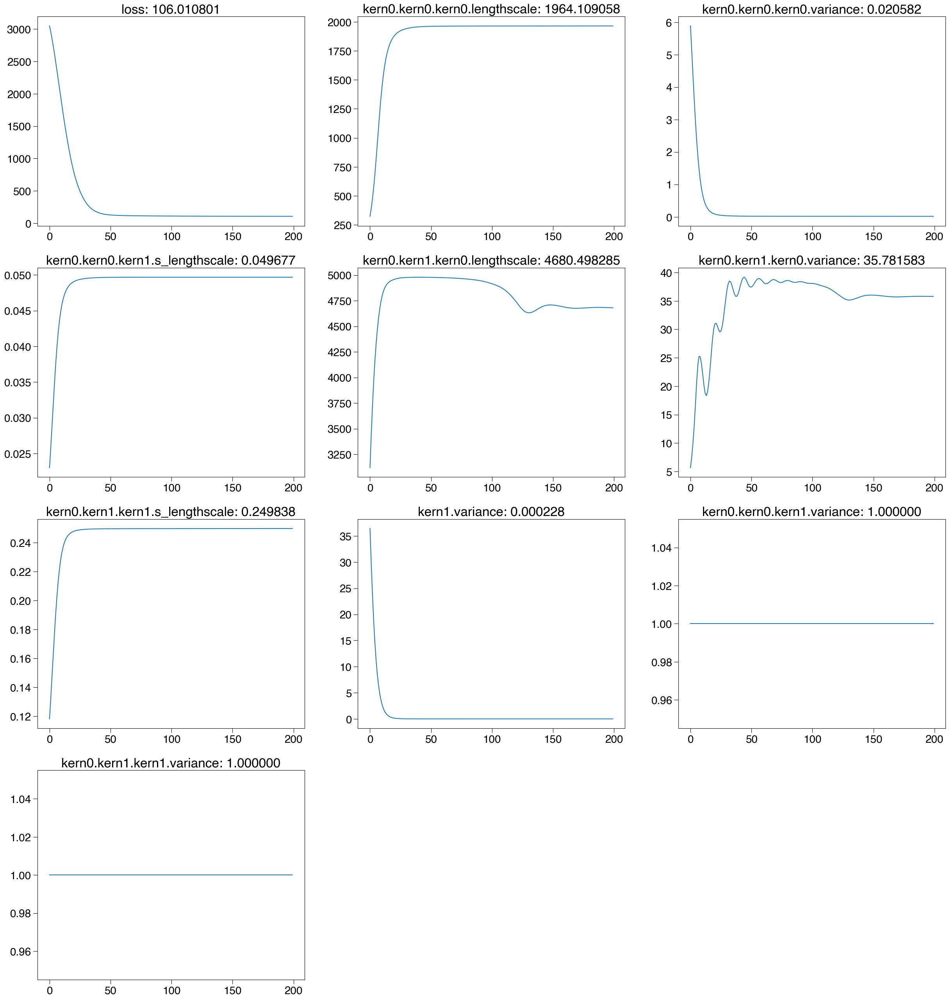

In [28]:
import time
st = time.time() 

# pyro.clear_param_store()
#define regionally non-linar spatio-temporal kernel
regional_nl_temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
regional_nl_temporal_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(500.), torch.tensor(5000.)))
regional_nl_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.05), torch.tensor(100.)))
regional_nl_spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
regional_nl_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.05), torch.tensor(0.25)))
regional_nl_kernel = PSTHM.kernels.Product(regional_nl_temporal_kernel, regional_nl_spatial_kernel)

#define locally non-linar spatio-temporal kernel
local_nl__temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,geo=False)
local_nl__temporal_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(100.), torch.tensor(2000.)))
local_nl__temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(0.1**2), torch.tensor(10.)))
local_nl__spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
local_nl__spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.01), torch.tensor(0.05)))
local_nl_kernel = PSTHM.kernels.Product(local_nl__temporal_kernel, local_nl__spatial_kernel)

#define whitenoise kernel
whitenoise_kernel = PSTHM.kernels.WhiteNoise(input_dim=1)
whitenoise_kernel.set_prior('variance',dist.Uniform(torch.tensor(0.01**2),torch.tensor(100.)))

#combine all kernels
combined_sp_kernel = PSTHM.kernels.Sum(local_nl_kernel,regional_nl_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,whitenoise_kernel)

y_residual = torch.tensor(y.cpu().detach().numpy() - ice7g_pred).double()
gpr_2 = PSTHM.model.GPRegression_V(X_new, y_residual, combined_sp_kernel,noise=torch.tensor(y_sigma**2),jitter=1e-5)

#Empirical bayes optimization, default iteration is 1000
gpr_2,track_list = PSTHM.opti.SVI_NI_optm(gpr_2,x_sigma=age_sigma,num_iteration=200,lr=0.3,decay_r = 0.8,step_size=50)

axes = PSTHM.plotting.plot_track_list(track_list)
et = time.time() # get the end time

# get the execution time
elapsed_time = et - st
print('Execution time: {:3.3f} s'.format( elapsed_time))

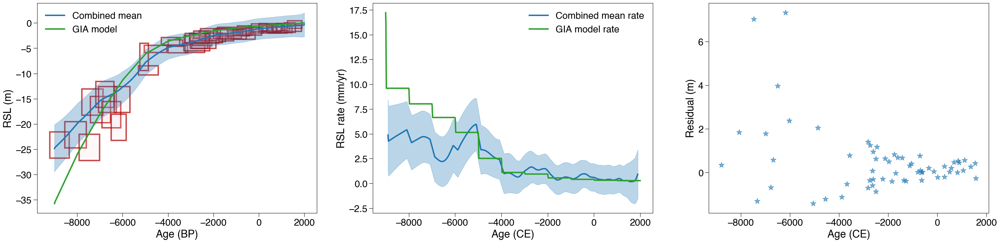

In [29]:
#generate prediction matrix
NJ_index = rsl_region==15
test_age = np.arange(-9000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
y_mean_2, y_var_2 = gpr_2(pred_matrix.double(), full_cov=True)
pred_matrix[:,2]+=360
GIA_pred = torch.tensor(ice7g_interp(pred_matrix))
y_combined= y_mean_2 + GIA_pred
y_std_2 = y_var_2.diag().sqrt()
rsl_time,rsl_rate_2,rsl_rate_sd_2 = PSTHM.post.cal_rate_var(test_age,y_var_2.cpu().detach().numpy(),y_combined.cpu().detach().numpy())
GIA_model_rate = np.gradient(GIA_pred,test_age)

#plot the prediction
plt.figure(figsize=(36,8))
ax = plt.subplot(131)
PSTHM.plotting.plot_uncertainty_boxes(X[:,0][NJ_index],y[NJ_index], age_sigma[NJ_index]*2,y_sigma[NJ_index]*2,ax=ax)
plt.plot(test_age,y_combined.detach().numpy(),'C0',linewidth=3,label='Combined mean')
plt.fill_between(test_age,y_combined.detach().numpy()-2*y_std_2.detach().numpy(),y_combined.detach().numpy()+2*y_std_2.detach().numpy(),color='C0',alpha=0.3)
plt.plot(test_age,GIA_pred,'C2',linewidth=3,label='GIA model')
plt.legend()

plt.subplot(132)
plt.plot(rsl_time,rsl_rate_2*1000,'C0',linewidth=3,label='Combined mean rate')
plt.fill_between(rsl_time,(rsl_rate_2-2*rsl_rate_sd_2)*1000,(rsl_rate_2+2*rsl_rate_sd_2)*1000,color='C0',alpha=0.3)
plt.plot(test_age,GIA_model_rate*1000,'C2',linewidth=3,label='GIA model rate')
plt.legend()
plt.ylabel('RSL rate (mm/yr)')
plt.xlabel('Age (CE)')

plt.subplot(133)
f = interpolate.interp1d(test_age,y_combined.detach().numpy())
residual = f(X[:,0][NJ_index])-y[NJ_index].detach().numpy()
plt.scatter(X[:,0][NJ_index],residual,s=150,marker='*',color='C0',alpha=0.6)
plt.xlabel('Age (CE)')
plt.ylabel('Residual (m)');

We can see that by combining the GIA and GP models, the final predictions now are influenced by physical model and observational data. Becuase GIA model is controlled by ice history, the resolution of which is typically very low, using GP can effectively help us to understand sea-level change with better temporal resolution.

We can further experience the effect of incorporating a GP with a GIA model when we doing spatial analysis. Let's plot the spatial distribution of RSL. 



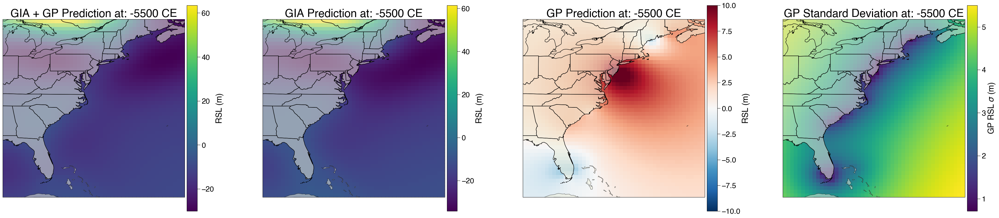

In [30]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
time_mat = np.array([-5500]) 
pred_matrix = PSTHM.post.gen_pred_matrix(time_mat,lat_matrix,lon_matrix)
pred_matrix[:,2]+=360
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
y_mean, y_var = gpr_2(pred_matrix, full_cov=True)
y_std_spa_2 = y_var.diag().sqrt()

GIA_pred_spa_2 = torch.tensor(ice7g_interp(pred_matrix))
y_combined_2= y_mean + GIA_pred_spa_2

#------------plot -----------------
plt.figure(figsize=(48,10))
ax2 = plt.subplot(141,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
cax = ax2.pcolor(lon_mat,lat_mat,y_combined_2.detach().numpy().reshape(lat_mat.shape),transform=ccrs.PlateCarree(),cmap='viridis',zorder=-1)
cbar = fig.colorbar(cax, ax=ax2, orientation='vertical', pad=0.01)
cbar.set_label('RSL (m)')
ax2.set_title('GIA + GP Prediction at: {:} CE'.format(time_mat[0]),fontsize=30)
# ax2.text(lon_mat.min()+2,lat_mat.max(), 'a',  fontsize=50, fontweight='bold', va='top', ha='right',color='w')

ax2 = plt.subplot(142,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
cax = ax2.pcolor(lon_mat,lat_mat,GIA_pred_spa_2.reshape(lat_mat.shape),transform=ccrs.PlateCarree(),cmap='viridis',zorder=-1)
cbar = fig.colorbar(cax, ax=ax2, orientation='vertical', pad=0.01)
cbar.set_label('RSL (m)')
ax2.set_title('GIA Prediction at: {:} CE'.format(time_mat[0]),fontsize=30)
# ax2.text(lon_mat.min()+2,lat_mat.max(), 'b',  fontsize=50, fontweight='bold', va='top', ha='right',color='w')

ax2 = plt.subplot(143,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
cax = ax2.pcolor(lon_mat,lat_mat,y_mean.detach().numpy().reshape(lat_mat.shape),transform=ccrs.PlateCarree(),cmap='RdBu_r',vmax=10,vmin=-10
                 ,zorder=-1)
cbar = fig.colorbar(cax, ax=ax2, orientation='vertical', pad=0.01)
cbar.set_label('RSL (m)')
ax2.set_title('GP Prediction at: {:} CE'.format(time_mat[0]),fontsize=30)
# ax2.text(lon_mat.min()+2,lat_mat.max(), 'c',  fontsize=50, fontweight='bold', va='top', ha='right',color='k')

ax2 = plt.subplot(144,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
cax = ax2.pcolor(lon_mat,lat_mat,y_std_spa_2.detach().numpy().reshape(lat_mat.shape),transform=ccrs.PlateCarree(),cmap='viridis',zorder=-1)
cbar = fig.colorbar(cax, ax=ax2, orientation='vertical', pad=0.01)
cbar.set_label('GP RSL $\sigma$ (m)')
# ax2.text(lon_mat.min()+2,lat_mat.max(), 'd',  fontsize=50, fontweight='bold', va='top', ha='right',color='k')
ax2.set_title('GP Standard Deviation at: {:} CE'.format(time_mat[0]),fontsize=30);
# plt.savefig('model_2GIA_GP_pred.png',dpi=300)

From the temporal analysis above we can find that the GIA prediction around New Jersey shows a RSL much lower than the observastions, in this case, GP predicts a strongly positive sea-level around New Jersey. Likewise, GIA prediction around Florida shows a RSL higher than the observations, therefore, GP model refines the sea level there. 

Compared to GP-only model, this combined approach shows a spatial sea-level pattern that is more consistent with sea-level physics. 

**STGP with multiple physical models for Holocene sea-level data**

Given the hugh uncertainty in ice history and Earth rheology, using one GIA model output to describe the GRD signal is often not appropriate. To improve this, we can use probablistic approach to combined multiple GIA model together, which is introduced in Tutorial 2. Let's try to use ice model from [Gowan et al., 2021](https://www.nature.com/articles/s41467-021-21469-w) with 1-D Earth rheology model with 71 km lithosphere, 0.3 and 70 x 10 $^{21}$ Pa s upper and lower mantle viscosity to describe an alternative sea-level pattern. 

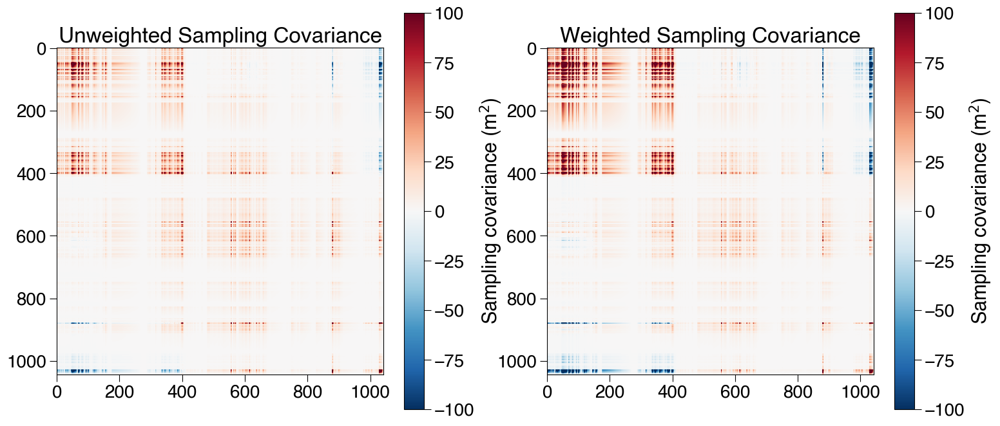

In [9]:
gowan_rsl = np.load('../3.ST_GP/gowan_rsl.npy')
#interpolate GIA model
gowan_interp = rgi((time_CE[::-1],lat,lon), gowan_rsl[::-1])
#transfer longitude from -180-180 to 0-360
gowan_pred = gowan_interp(X_new)
ANU_time = np.array([0, 0.1 ,  1.  ,  2.3 ,  2.83,  3.66,  4.75,  6.  ,  6.8 ,  7.35,
        7.9 ,  8.45,  9.65, 10.27, 10.91, 11.54, 12.  , 13.  ])
ANU_time_CE = -(ANU_time*1000-1950)+67
ANU_rsl = np.load('../3.ST_GP/ANU.npy')[:,::-1]
ANU_interp = rgi((ANU_time_CE,lat,lon), ANU_rsl)
ANU_pred = ANU_interp(X_new)

#-------generate some synthetic GIA predictions-----

ANU_interp_2 = rgi((ANU_time_CE,lat,lon), ANU_rsl*1.5)
ANU_interp_3 = rgi((ANU_time_CE,lat,lon), ANU_rsl/1.5)
ANU_pred_2 = ANU_interp_2(X_new)
ANU_pred_3 = ANU_interp_3(X_new)
ice7g_interp_2 = rgi((time_CE[::-1],lat,lon), ice7g_rsl[::-1]*1.5)
ice7g_interp_3 = rgi((time_CE[::-1],lat,lon), ice7g_rsl[::-1]/1.5)
ice7g_pred_2 = ice7g_interp_2(X_new)
ice7g_pred_3 = ice7g_interp_3(X_new)
gowan_interp_2 = rgi((time_CE[::-1],lat,lon), gowan_rsl[::-1]*1.5)
gowan_interp_3 = rgi((time_CE[::-1],lat,lon), gowan_rsl[::-1]/1.5)
gowan_pred_2 = gowan_interp_2(X_new)
gowan_pred_3 = gowan_interp_3(X_new)

all_rsl = np.zeros([9,len(X_new)])
all_rsl[0] = ice7g_pred
all_rsl[1] = gowan_pred
all_rsl[2] =ANU_pred
all_rsl[3] = ice7g_pred_2
all_rsl[4] = gowan_pred_2
all_rsl[5] = ANU_pred_2
all_rsl[6] = ice7g_pred_3
all_rsl[7] = gowan_pred_3
all_rsl[8] = ANU_pred_3

emp_covar =   np.cov(all_rsl.T)

#calculate goodness of fit based on mean sqaured difference
ice7g_weight = np.mean((ice7g_pred - y.cpu().detach().numpy())**2)
gowan_weight = np.mean((gowan_pred - y.cpu().detach().numpy())**2)
ANU_weight = np.mean((ANU_pred - y.cpu().detach().numpy())**2)
ice7g_2_weight = np.mean((ice7g_pred_2 - y.cpu().detach().numpy())**2)
gowan_2_weight = np.mean((gowan_pred_2 - y.cpu().detach().numpy())**2)
ANU_2_weight = np.mean((ANU_pred_2 - y.cpu().detach().numpy())**2)
ice7g_3_weight = np.mean((ice7g_pred_3 - y.cpu().detach().numpy())**2)
gowan_3_weight = np.mean((gowan_pred_3 - y.cpu().detach().numpy())**2)
ANU_3_weight = np.mean((ANU_pred_3 - y.cpu().detach().numpy())**2)

weights = np.array([ice7g_weight,gowan_weight,ANU_weight,ice7g_2_weight,gowan_2_weight,ANU_2_weight,ice7g_3_weight,gowan_3_weight,ANU_3_weight])
weights = weights/np.sum(weights)
weigthed_emp_covar = np.cov(all_rsl.T,aweights=weights)

plt.figure(figsize=(18,8))
plt.subplot(121)
plt.imshow(emp_covar,cmap='RdBu_r',vmax=100,vmin=-100)
plt.colorbar(label='Sampling covariance (m$^2$)')
plt.title('Unweighted Sampling Covariance')

plt.subplot(122)
plt.imshow(weigthed_emp_covar,cmap='RdBu_r',vmax=100,vmin=-100)
plt.colorbar(label='Sampling covariance (m$^2$)')
plt.title('Weighted Sampling Covariance');

You can start to see some non-stationary features in this covariance function. Let's combine this weighted sampling kernel with a local non-linear kernel as we used before. You can use the Emprical kernel function in PaleoSTeHM. To stabilize the estimate and reduce variability related to finite sample size, we applied a temporal Gaussian taper function to each sampling kernel function $K_{emp}$, so it becomes:
$$
K_{emp}(X,X') = K_{emp}(X,X') \times exp(-|t-t'|^2/\tau^2)
$$
where $X$ indicates spatiotemporal information, $|t-t'|^2$ is squared temporal distance matrix, $\tau$ is parameter for temporal tapering, if you do not set $\tau$, there is no tapering. Here we set 2000 year taper. And we use an sampling kernel with a whitenoise kernel to discribe sea level change.

In [10]:

st = time.time() 

pyro.clear_param_store()

#define locally non-linar spatio-temporal kernel
model_ensemble = [ice7g_interp,gowan_interp,ANU_interp,ice7g_interp_2,gowan_interp_2,ANU_interp_2,ice7g_interp_3,gowan_interp_3,ANU_interp_3]
sampling_kernel = PSTHM.kernels.Sampling(input_dim=1,model_ensemble=model_ensemble,weights=weights,tau=2000)

#define locally non-linar spatio-temporal kernel
white_noise_kernel = PSTHM.kernels.WhiteNoise(input_dim =1)
white_noise_kernel.set_prior('variance',dist.Uniform(0.01**2,100.))
combined_sp_kernel = PSTHM.kernels.Sum(sampling_kernel,white_noise_kernel)

gpr_4 = PSTHM.model.GPRegression_V(X_new, y, combined_sp_kernel,noise=torch.tensor(y_sigma**2),jitter=1e-5)
gpr_4,track_list = PSTHM.opti.SVI_NI_optm(gpr_4,age_sigma,num_iteration=100,lr=0.2)
# PSTHM.plotting.plot_track_list(track_list)
et = time.time() # get the end time

# get the execution time
elapsed_time = et - st
print('Execution time: {:3.3f} s'.format( elapsed_time))

  0%|          | 0/100 [00:00<?, ?it/s]

Execution time: 12.311 s


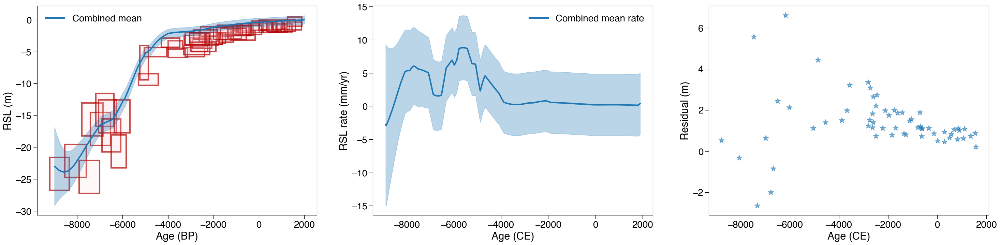

In [11]:
#generate prediction matrix
#Change the number here to visulize RSL at different sites!
#this range can be between1-16
NJ_index = rsl_region==15
#------------------------------------------------------------
test_age =  np.arange(-9000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
pred_matrix[:,2]+=360
y_mean_3, y_var_3 = gpr_4(pred_matrix.double(), full_cov=True)
y_std_3 = y_var_3.diag().sqrt()
rsl_time_3,rsl_rate_3,rsl_rate_sd_3 = PSTHM.post.cal_rate_var(test_age,y_var_3.cpu().detach().numpy(),y_mean_3.cpu().detach().numpy())


#plot the prediction
plt.figure(figsize=(36,8))
ax = plt.subplot(131)
PSTHM.plotting.plot_uncertainty_boxes(X[:,0][NJ_index],y[NJ_index], age_sigma[NJ_index]*2,y_sigma[NJ_index]*2,ax=ax)
plt.plot(test_age,y_mean_3.detach().numpy(),'C0',linewidth=3,label='Combined mean')
plt.fill_between(test_age,y_mean_3.detach().numpy()-2*y_std_3.detach().numpy(),y_mean_3.detach().numpy()+2*y_std_3.detach().numpy(),color='C0',alpha=0.3)

plt.legend()

plt.subplot(132)
plt.plot(rsl_time_3,rsl_rate_3*1000,'C0',linewidth=3,label='Combined mean rate')
plt.fill_between(rsl_time_3,(rsl_rate_3-2*rsl_rate_sd_3)*1000,(rsl_rate_3+2*rsl_rate_sd_3)*1000,color='C0',alpha=0.3)
plt.legend()
plt.ylabel('RSL rate (mm/yr)')
plt.xlabel('Age (CE)')

plt.subplot(133)
f = interpolate.interp1d(test_age,y_mean_3.detach().numpy())
residual = f(X[:,0][NJ_index])-y[NJ_index].detach().numpy()
plt.scatter(X[:,0][NJ_index],residual,s=150,marker='*',color='C0',alpha=0.6)
plt.xlabel('Age (CE)')
plt.ylabel('Residual (m)');



In [12]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
test_time = -5500.
pred_matrix = PSTHM.post.gen_pred_matrix([test_time],lat_matrix,lon_matrix)
pred_matrix[:,2]+=360

#-----------------define the kernel to decompose-----------------
y_mean_spa_3, y_var_spa_3 = gpr_4(pred_matrix.double(), full_cov=True)
y_std_spa_3 = y_var_spa_3.diag().sqrt()


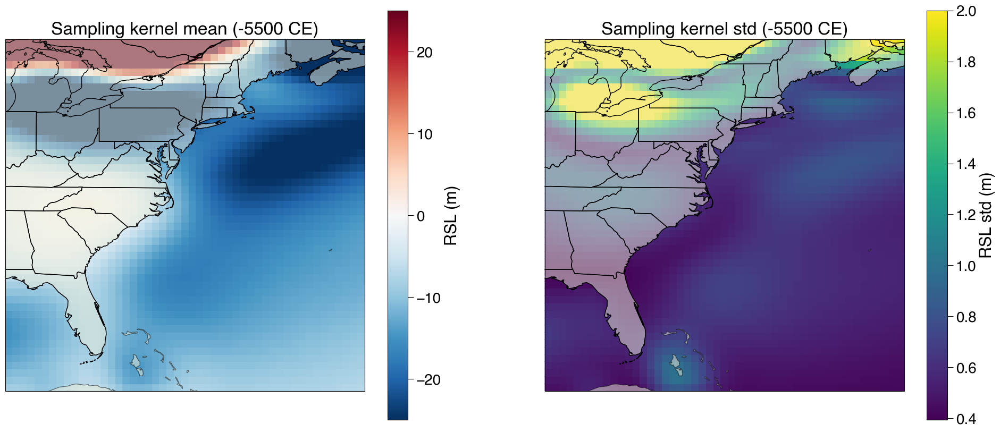

In [13]:
plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(y_mean_spa_3).detach().numpy().reshape(lat_mat.shape),zorder=-1,vmax=25,vmin=-25,cmap='RdBu_r')
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('Sampling kernel mean ({:} CE)'.format(int(test_time)))

ax2 = plt.subplot(122,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(y_std_spa_3).detach().numpy().reshape(lat_mat.shape),zorder=-1,vmax=2)

plt.colorbar(im,ax=ax2,label='RSL std (m)')
plt.title('Sampling kernel std ({:} CE)'.format(int(test_time)));


You can now see that because we are using a physical model, the uncertainty 

**Probabilistically calibrating physical model ensemble**

You can also only define a GP kernel with a whitenoise kernel but sampling the weighting parameter for different physical models, so the output is a probablity distribution of different physical parameters.

  0%|          | 0/300 [00:00<?, ?it/s]

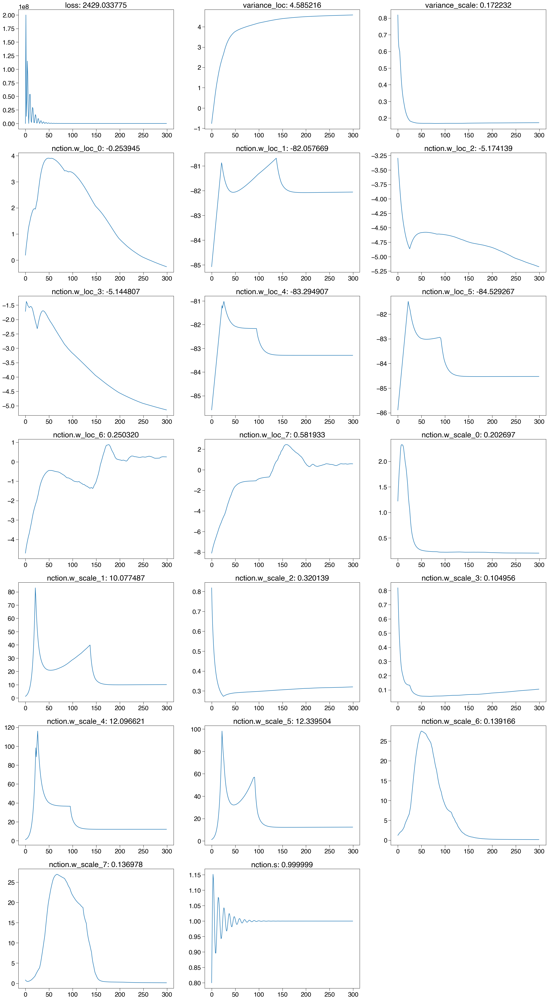

In [16]:
torch.manual_seed(15)

import time
st = time.time() 

pyro.clear_param_store()


#define whitenoise kernel
whitenoise_kernel = PSTHM.kernels.WhiteNoise(input_dim=1)
whitenoise_kernel.set_prior('variance',dist.Uniform(torch.tensor(0.01**2),torch.tensor(0.5**2)))
whitenoise_kernel.autoguide("variance",dist.Normal) 

#combine all kernels
#----define mean function
#calculate normal likelihood misfit 
misfit_store = []
for i in range(len(model_ensemble)):
    test_pred = model_ensemble[i](gpr_4.X)
    test_misfit = torch.mean(((gpr_4.y-test_pred)/y_sigma)**2)
    misfit_store.append(test_misfit)
misfit_store = np.array(misfit_store)
#define prior distribution for the weights according to model misfit to data
alpha = torch.tensor(1/misfit_store**2)*1/torch.tensor(1/misfit_store**2).sum()
alpha = torch.tensor(alpha,dtype=torch.float32)
# the first number (2) here means there are 2 GIA models to interpolate
mean_fn = PSTHM.model.GIA_ensemble(model_ensemble)
mean_fn.set_prior('w',dist.Dirichlet(alpha))
mean_fn.autoguide("w",dist.Normal) 
mean_fn.set_prior('s',dist.Normal(torch.tensor(1.0),torch.tensor(1e-5)))

gpr_5 = PSTHM.model.GPRegression_V(X_new, y,kernel = whitenoise_kernel,noise=torch.tensor(y_sigma**2),jitter=1e-5,mean_function=mean_fn)
gpr_5,track_list = PSTHM.opti.SVI_optm(gpr_5,num_iteration=300,lr=0.2,decay_r=0.8,step_size=50)
PSTHM.plotting.plot_track_list(track_list);

#you can use MCMC here
# mcmc = PSTHM.opti.NUTS_mcmc(gpr_5,num_samples=2000,warmup_steps=200)


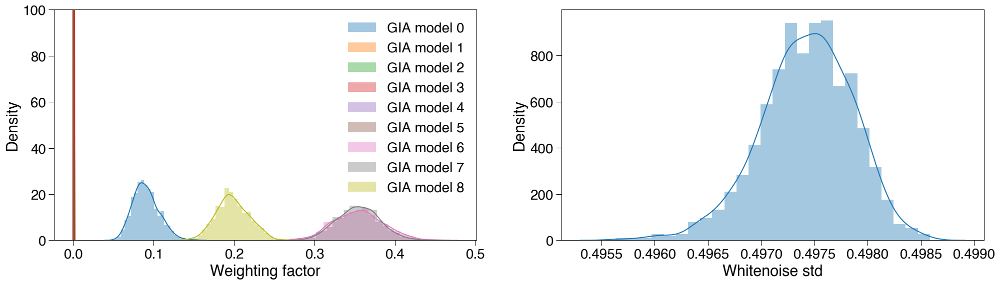

In [17]:
import seaborn as sns
testing_num = 1000
post_w = np.zeros([testing_num,len(model_ensemble)])
post_whitenoise = np.zeros([testing_num])
for i in range(testing_num):
    post_w[i] = mean_fn.w
    post_whitenoise[i] = whitenoise_kernel.variance

plt.figure(figsize=(24,6))
plt.subplot(121)
for i in range(len(model_ensemble)):
    sns.distplot(post_w[:,i],label='GIA model '+str(i))
plt.legend(loc=1)
plt.ylim(0,100)
plt.xlabel('Weighting factor')
plt.subplot(122)
sns.distplot(post_whitenoise**0.5)
plt.xlabel('Whitenoise std');

In [18]:
#generate prediction matrix
#Change the number here to visulize RSL at different sites!
#this range can be between1-16
NJ_index = rsl_region==15
#------------------------------------------------------------
test_age =  np.arange(-9000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[NJ_index]),np.mean(rsl_lon[NJ_index]))
pred_matrix[:,2]+=360

mean_fun_pred = np.zeros([1000,len(test_age)])
for i in range(1000):
    mean_fun_pred[i] = gpr_5.mean_function(pred_matrix)
mean_fun_std = np.std(mean_fun_pred,axis=0)
mean_pred,kernel_cov = gpr_5(pred_matrix,full_cov=True)
kernel_std = kernel_cov.diag().sqrt()
std_pred = (kernel_std**2+mean_fun_std**2)**0.5

rsl_time_5,rsl_rate_5,rsl_rate_sd_5 = PSTHM.post.cal_rate_var(test_age,kernel_cov.detach().numpy(),mean_pred.detach().numpy())

rate_pred = np.gradient(mean_fun_pred,test_age,axis=1)
mean_rate_pred = np.mean(rate_pred,axis=0)
std_rate_pred = np.std(rate_pred,axis=0)

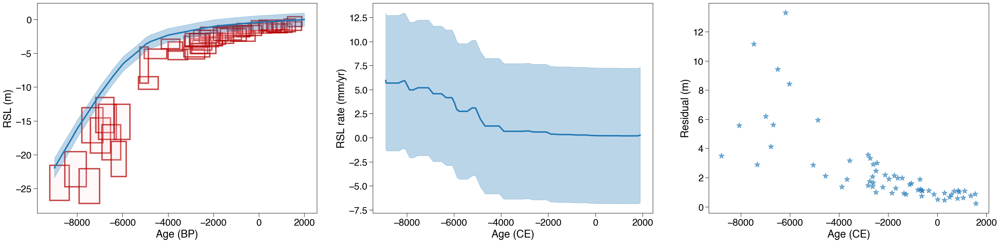

In [19]:
#plot the prediction
plt.figure(figsize=(36,8))
ax = plt.subplot(131)
PSTHM.plotting.plot_uncertainty_boxes(X[:,0][NJ_index],y[NJ_index], age_sigma[NJ_index]*2,y_sigma[NJ_index]*2,ax=ax)
plt.plot(test_age,mean_pred,'C0',linewidth=3)
plt.fill_between(test_age,mean_pred-2*std_pred,mean_pred+2*std_pred,color='C0',alpha=0.3)

plt.subplot(132)
plt.plot(rsl_time_5,rsl_rate_5*1000,'C0',linewidth=3)
plt.fill_between(rsl_time_5,(rsl_rate_5-2*rsl_rate_sd_5)*1000,(rsl_rate_5+2*rsl_rate_sd_5)*1000,color='C0',alpha=0.3)

plt.ylabel('RSL rate (mm/yr)')
plt.xlabel('Age (CE)')
plt.subplot(133)
f = interpolate.interp1d(test_age,mean_pred)
residual = f(X[:,0][NJ_index])-y[NJ_index].detach().numpy()
plt.scatter(X[:,0][NJ_index],residual,s=150,marker='*',color='C0',alpha=0.6)
plt.xlabel('Age (CE)')
plt.ylabel('Residual (m)');



In [20]:
lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
test_time = -5500.
pred_matrix = PSTHM.post.gen_pred_matrix([test_time],lat_matrix,lon_matrix)
pred_matrix[:,2]+=360

mean_fun_pred = np.zeros([1000,len(pred_matrix)])
for i in range(1000):
    mean_fun_pred[i] = gpr_5.mean_function(pred_matrix)

mean_fun_std = np.std(mean_fun_pred,axis=0)
mean_pred_spa,kernel_cov = gpr_5(pred_matrix,full_cov=True)
kernel_std = kernel_cov.diag().sqrt()
std_pred_spa = (kernel_std**2+mean_fun_std**2)**0.5


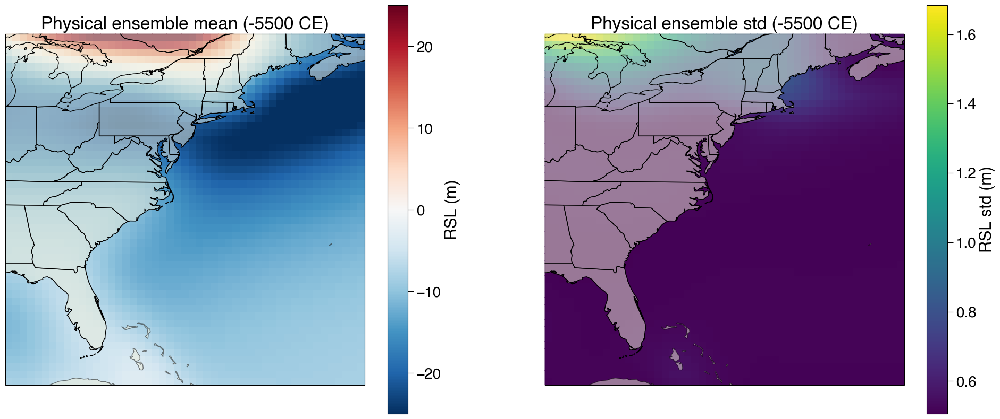

In [21]:
plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(mean_pred_spa).reshape(lat_mat.shape),zorder=-1,vmax=25,vmin=-25,cmap='RdBu_r')
plt.colorbar(im,ax=ax2,label='RSL (m)')
plt.title('Physical ensemble mean ({:} CE)'.format(int(test_time)))

ax2 = plt.subplot(122,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(std_pred_spa).reshape(lat_mat.shape),zorder=-1)

plt.colorbar(im,ax=ax2,label='RSL std (m)')
plt.title('Physical ensemble std ({:} CE)'.format(int(test_time)));


**Comparison**

In [22]:
site_index = rsl_region==15

test_age =  np.arange(-9000,2010,10)
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,np.mean(rsl_lat[site_index]),np.mean(rsl_lon[site_index]))
pred_matrix[:,2]+=360

lat_matrix = np.arange(np.min(rsl_lat)-2,np.max(rsl_lat)+2,0.5)
lon_matrix = np.arange(np.min(rsl_lon)-5,np.max(rsl_lon)+5,0.5)
lon_mat,lat_mat = np.meshgrid(lon_matrix,lat_matrix)
test_time = -5500.
pred_matrix_2 = PSTHM.post.gen_pred_matrix([test_time],lat_matrix,lon_matrix)
pred_matrix_2[:,2]+=360

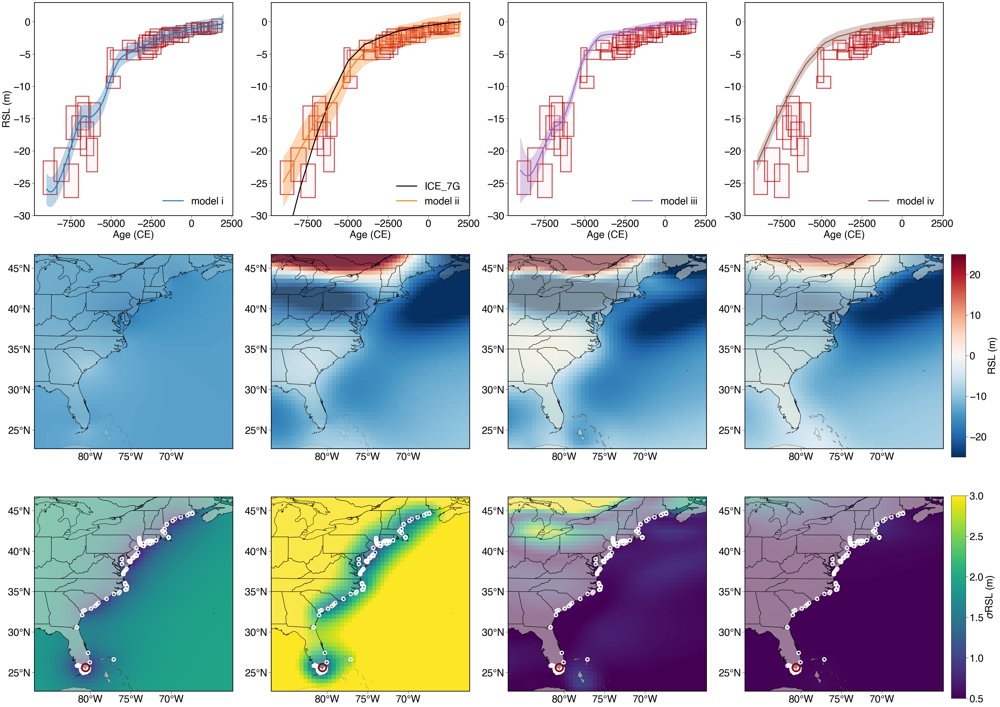

In [32]:
def thicken_frame(ax, linewidth=2):
    for spine in ax.spines.values():
        spine.set_linewidth(linewidth)

from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

lon_formatter = LongitudeFormatter(zero_direction_label=True)
lat_formatter = LatitudeFormatter()
std_max = 3.0
std_min = 0.5

plt.figure(figsize=(40,30))
ax1 = plt.subplot(341)
ax1.tick_params(axis='both', which='major', labelsize=30)

PSTHM.plotting.plot_uncertainty_boxes(X[:,0][site_index],y[site_index], age_sigma[site_index]*2,y_sigma[site_index]*2,ax=ax1,CE=True)
plt.plot(test_age,y_mean_1.detach().numpy(),'C0',linewidth=3,label='model i')
plt.fill_between(test_age,y_mean_1.detach().numpy()-1.645*y_std_1.detach().numpy(),y_mean_1.detach().numpy()+1.645*y_std_1.detach().numpy(),color='C0',alpha=0.3)
plt.ylim(-30,3)
plt.legend(loc=4,fontsize=30)
plt.ylabel('RSL (m)',fontsize=30)
thicken_frame(ax1)
plt.xlabel('Age (CE)',fontsize=30)

ax1 = plt.subplot(345,projection=ccrs.PlateCarree())
thicken_frame(ax1)

ax1.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.2)
ax1.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax1.pcolor(lon_mat,lat_mat,(y_mean_spa_1).reshape(lat_mat.shape),zorder=-1,vmax=25,vmin=-25,cmap='RdBu_r')

ax1.xaxis.set_major_formatter(lon_formatter)
ax1.yaxis.set_major_formatter(lat_formatter)
ax1.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax1.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
# ax1.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)
# ax1.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)
ax1.tick_params(axis='both', which='major', labelsize=30)

ax2 = plt.subplot(349,projection=ccrs.PlateCarree())
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(y_std_spa_1).reshape(lat_mat.shape),zorder=-1,vmax=std_max,vmin=std_min)

ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)

ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)
ax2.tick_params(axis='both', which='major', labelsize=30)

thicken_frame(ax2)

ax2 = plt.subplot(342)
thicken_frame(ax2)
ax2.tick_params(axis='both', which='major', labelsize=30)

PSTHM.plotting.plot_uncertainty_boxes(X[:,0][site_index],y[site_index], age_sigma[site_index]*2,y_sigma[site_index]*2,ax=ax2,CE=True)
plt.xlabel('Age (CE)',fontsize=30)
plt.plot(test_age,GIA_pred,'k',linewidth=3,linestyle='-',label='ICE_7G')
plt.plot(test_age,y_combined.detach().numpy(),'C1',linewidth=3,label='model ii')
plt.fill_between(test_age,y_combined.detach().numpy()-1.645*y_std_2.detach().numpy(),y_combined.detach().numpy()+1.645*y_std_2.detach().numpy(),color='C1',alpha=0.3)
plt.ylim(-30,3)
plt.legend(loc=4,fontsize=30)
plt.ylabel('')
ax2 = plt.subplot(346,projection=ccrs.PlateCarree())
thicken_frame(ax2)
# ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)

# ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)

cax = ax2.pcolor(lon_mat,lat_mat,y_combined_2.detach().numpy().reshape(lat_mat.shape),transform=ccrs.PlateCarree(),vmax=25,vmin=-25,cmap='RdBu_r',zorder=-1)

ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.2)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
ax2.tick_params(axis='both', which='major', labelsize=30)

ax2 = plt.subplot(3,4,10,projection=ccrs.PlateCarree())
thicken_frame(ax2)

ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.2)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
cax = ax2.pcolor(lon_mat,lat_mat,y_std_spa_2.detach().numpy().reshape(lat_mat.shape),transform=ccrs.PlateCarree(),zorder=-1,vmax=std_max,vmin=std_min)
ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)

ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)
ax2.tick_params(axis='both', which='major', labelsize=30)

ax2 = plt.subplot(343)
thicken_frame(ax2)
ax2.tick_params(axis='both', which='major', labelsize=30)

PSTHM.plotting.plot_uncertainty_boxes(X[:,0][site_index],y[site_index], age_sigma[site_index]*2,y_sigma[site_index]*2,ax=ax2,CE=True)
plt.plot(test_age,y_mean_3.detach().numpy(),'C4',linewidth=3,label='model iii')
plt.fill_between(test_age,y_mean_3.detach().numpy()-1.645*y_std_3.detach().numpy(),y_mean_3.detach().numpy()+1.645*y_std_3.detach().numpy(),color='C4',alpha=0.3)
plt.legend(loc=4,fontsize=30)
plt.ylim(-30,3)
plt.ylabel('')
plt.xlabel('Age (CE)',fontsize=30)

ax2 = plt.subplot(347,projection=ccrs.PlateCarree())
thicken_frame(ax2)

ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(y_mean_spa_3).detach().numpy().reshape(lat_mat.shape),zorder=-1,vmax=25,vmin=-25,cmap='RdBu_r')
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
# ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)
# ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)

ax2.tick_params(axis='both', which='major', labelsize=30)

ax2 = plt.subplot(3,4,11,projection=ccrs.PlateCarree())
thicken_frame(ax2)
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im = ax2.pcolor(lon_mat,lat_mat,(y_std_spa_3).detach().numpy().reshape(lat_mat.shape),zorder=-1,vmax=std_max,vmin=std_min)
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)

ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)
ax2.tick_params(axis='both', which='major', labelsize=30)


ax2 = plt.subplot(344)
thicken_frame(ax2)
ax2.tick_params(axis='both', which='major', labelsize=30)

PSTHM.plotting.plot_uncertainty_boxes(X[:,0][site_index],y[site_index], age_sigma[site_index]*2,y_sigma[site_index]*2,ax=ax2,CE=True)
plt.fill_between(test_age,mean_pred-1.645*std_pred,mean_pred+1.645*std_pred,color='C5',alpha=0.3)
plt.ylim(-30,3)
# for i in range(6,9):
#     if i==6:
#         plt.plot(test_age,model_ensemble[i](pred_matrix),label='Best fitting 3 GIA models',color='k',linewidth=3,linestyle='--', dashes=(10, 10))
#     else:
#         plt.plot(test_age,model_ensemble[i](pred_matrix),color='k',linewidth=3,linestyle='--', dashes=(10, 10))
plt.plot(test_age,mean_pred,'C5',linewidth=3,label='model iv')
plt.xlabel('Age (CE)',fontsize=30)

plt.legend(loc=4,fontsize=30)
plt.ylabel('')
ax2 = plt.subplot(3,4,8,projection=ccrs.PlateCarree())
thicken_frame(ax2)
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im6 = ax2.pcolor(lon_mat,lat_mat,(mean_pred_spa).reshape(lat_mat.shape),zorder=-1,vmax=25,vmin=-25,cmap='RdBu_r')
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
ax2.tick_params(axis='both', which='major', labelsize=30)
# ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)

# ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)

ax2 = plt.subplot(3,4,12,projection=ccrs.PlateCarree())
thicken_frame(ax2)
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.add_feature(cfeature.STATES, edgecolor='black', zorder=0)
im7 = ax2.pcolor(lon_mat,lat_mat,(std_pred_spa).reshape(lat_mat.shape),zorder=-1,vmax=std_max,vmin=std_min)
ax2.xaxis.set_major_formatter(lon_formatter)
ax2.yaxis.set_major_formatter(lat_formatter)
ax2.set_xticks(np.arange(-70,-85,-5), crs=ccrs.PlateCarree())  
ax2.set_yticks(np.arange(25,50,5), crs=ccrs.PlateCarree())
ax2.tick_params(axis='both', which='major', labelsize=30)

ax2.scatter(rsl_lon,rsl_lat,ec='w',s=100,facecolor='none',zorder=1,linewidths=3)
ax2.scatter(np.mean(rsl_lon[site_index]),np.mean(rsl_lat[site_index]),ec='darkred',s=500,facecolor='none',zorder=1,linewidths=5)


cbar_ax = plt.gcf().add_axes([0.99, 0.362, 0.015, 0.28])  # adjust the dimensions as needed
cbar1 = plt.colorbar(im6, cax=cbar_ax,label='RSL (m)')
cbar1.ax.tick_params(labelsize=30)  # Set tick font size
cbar1.set_label('RSL (m)', size=30)  # Set label and its font size

# Third row, spatial plots not shown for brevity, but similar approach

# Add the colorbar code here for the third row, similar to above
# plt.subplots_adjust(right=0.85)
cbar_ax2 = plt.gcf().add_axes([0.99, 0.0285, 0.015, 0.28])  # adjust the dimensions as needed
cbar2 = plt.colorbar(im7, cax=cbar_ax2)  # Assuming 'im6' type data; replace with correct image handle as needed
cbar2.ax.tick_params(labelsize=30)  # Set tick font size
cbar2.set_label('$\sigma$RSL (m)', size=30)  # Set label and its font size
plt.tight_layout()

# plt.savefig('method_comparison.pdf',dpi=300)

### 8. (and last!!!) Spatiotemporal Gaussian Process - example application (Kopp et al., 2016)

Here, we will try to replicate global sea-level change signal in Common Era by [Kopp et al., 2016](https://www.pnas.org/doi/abs/10.1073/pnas.1517056113). 

There are two types of sea-level data, modern tide gauge measurements and geological proxy data. 

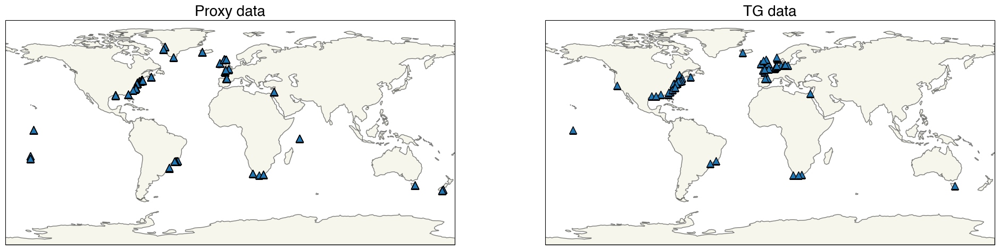

In [33]:
import os
import zipfile

#load the proxy data
proxy_data = pd.read_csv('../4.Applications/IFILES/RSL_All_30Dec2015.csv')
trainfirsttime = -1000
proxy_data = proxy_data[proxy_data['Age (CE)']>trainfirsttime]

TG_ID = pd.read_excel('../4.Applications/IFILES/TG_ID.xlsx',skiprows=np.arange(1,4))

TG_data_folder = '../../Data/TG_data/'

if len(os.listdir(TG_data_folder))<5:
    with zipfile.ZipFile(TG_data_folder+'TG_data.zip', 'r') as zip_ref:
        zip_ref.extractall(TG_data_folder)
site_file = pd.read_table(TG_data_folder+'/filelist.txt',delimiter=';',header=None)
selection_index = np.array([i in list(TG_ID['PSMSL ID']) for i in site_file.iloc[:,0]])
selected_sites = site_file.iloc[selection_index,:]

plt.figure(figsize=(24,10))
ax2 = plt.subplot(121,projection=ccrs.PlateCarree())
ax2.set_global()
ax2.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax2.scatter(proxy_data['Longitude (E)'],proxy_data['Latitude (N)'],transform=ccrs.PlateCarree(),zorder=1,
            marker='^',s=100,ec='k')
ax2.set_title('Proxy data',fontsize=20)

ax1 = plt.subplot(122,projection=ccrs.PlateCarree())
ax1.set_global()
ax1.add_feature(cartopy.feature.LAND,edgecolor='black',zorder=0,alpha=0.5)
ax1.scatter(selected_sites.iloc[:,2],selected_sites.iloc[:,1],transform=ccrs.PlateCarree(),zorder=1,
            marker='^',s=100,ec='k')
ax1.set_title('TG data',fontsize=20);

**Load 1900-2010 global sea-level curve from Hay et al., 2015**


In [35]:
import scipy.io as sio
gslfile = os.path.join('../4.Applications/IFILES', 'Hay2015_KFandGP_GMSL.mat')

Haydat = sio.loadmat(gslfile)
Hay = {}

Hay['Y'] = Haydat['KF_GMSL'][0]
Hay['dY'] = np.sqrt(np.diag(Haydat['KF_GMSL_var']))
Hay['Ycv'] = Haydat['KF_GMSL_var']
Hay['datid'] = np.zeros_like(Hay['Y'])
Hay['time1'] = Haydat['tt_KF'][:]
Hay['time2'] = Hay['time1']
Hay['meantime'] = Hay['time1']
Hay['lat'] = np.ones_like(Hay['Y']) * 1e6
Hay['long'] = Hay['lat']
Hay['compactcorr'] = np.zeros_like(Hay['Y'])
Hay['limiting'] = np.zeros_like(Hay['Y'])
Hay['istg'] = np.ones_like(Hay['Y'])
Hay['siteid'] = 0
Hay['sitenames'] = ['Hay_KF_GMSL']
Hay['sitecoords'] = [1e6, 1e6]
Hay['sitelen'] = len(Hay['Y'])

# Smooth Hay et al curve
Hayavgwin = 10
Haystep = 10
HayGSL = Hay.copy()
HayGSL['time1'] = np.arange(1885, 2006, Haystep)
HayGSL['time2'] = HayGSL['time1']
HayGSL['meantime'] = HayGSL['time1']
M = np.abs(np.subtract.outer(HayGSL['time1'], Hay['time1'])) <= (Hayavgwin / 2)
M = M[:,0,:]
M = M / np.sum(M, axis=1, keepdims=True)
HayGSL['Y'] = M @ Hay['Y']
HayGSL['Ycv'] = M @ Hay['Ycv'] @ M.T
HayGSL['dY'] = np.sqrt(np.diag(HayGSL['Ycv']))
HayGSL['datid'] = np.zeros_like(HayGSL['Y'])
HayGSL['lat'] = np.ones_like(HayGSL['Y']) * 1e6
HayGSL['long'] = HayGSL['lat']
HayGSL['compactcorr'] = np.zeros_like(HayGSL['Y'])
HayGSL['limiting'] = np.zeros_like(HayGSL['Y'])
HayGSL['istg'] = np.ones_like(HayGSL['Y'])


**Load global mean sea-level flatter: pseudo data so that average rate of change between -100 to 100 CE and 1600-1800 CE is the same**

In [36]:
GSLflattener = {}
GSLflattener['sigma'] = 1e4
GSLflattener['time1'] = 0.01 + np.concatenate((np.arange(-100, 101, 50), np.arange(1600, 1801, 50)))
GSLflattener['Y'] = np.zeros_like(GSLflattener['time1'])
GSLflattener['Ycv'] = np.ones((len(GSLflattener['Y']), len(GSLflattener['Y']))) * (GSLflattener['sigma']**2)

GSLflattener['Ycv'][:5, :5] += ((0.0025 * 1700)**2 + np.eye(5) * GSLflattener['sigma']**2 - GSLflattener['sigma']**2 / 5)
GSLflattener['Ycv'][5:10, 5:10] += (np.eye(5) * GSLflattener['sigma']**2 - GSLflattener['sigma']**2 / 5)

GSLflattener['dY'] = np.sqrt(np.diag(GSLflattener['Ycv']))
GSLflattener['datid'] = np.zeros_like(GSLflattener['Y'])
GSLflattener['time2'] = GSLflattener['time1']
GSLflattener['meantime'] = GSLflattener['time1']
GSLflattener['lat'] = np.ones_like(GSLflattener['Y']) * 1e6
GSLflattener['long'] = GSLflattener['lat']
GSLflattener['compactcorr'] = np.zeros_like(GSLflattener['Y'])
GSLflattener['limiting'] = np.zeros_like(GSLflattener['Y'])
GSLflattener['istg'] = np.ones_like(GSLflattener['Y'])
GSLflattener['siteid'] = 0
GSLflattener['sitenames'] = ['GSLflattener']
GSLflattener['sitecoords'] = [1e6, 1e6]
GSLflattener['sitelen'] = len(GSLflattener['Y'])


**Load three old TG data**

Check [Kopp et al., 2016](https://www.pnas.org/doi/abs/10.1073/pnas.1517056113) for details.

In [38]:
import os
from scipy.sparse import dia_matrix

# old tide gauges

TGold = {
    'datid': [],
    'meantime': [],
    'Y': [],
    'dY': [],
    'lat': [],
    'long': [],
    'siteid': [],
    'sitenames': [],
    'sitecoords': [],
    'sitelen': [],
    'time1': [],
    'time2': [],
    'limiting': [],
    'compactcorr': [],
    'istg': [],
    'Ycv': None
}

for ppp in range(1, 4):
    if ppp == 1:
        dat = pd.read_csv(os.path.join('../4.Applications/IFILES', 'amsterdam.sea.level.txt'), delim_whitespace=True,header=None)
        wsite = 'AMSTERDAM_OLD'
        wcurid = 5001
        wlat = [52.3667]
        wlong = [4.9000]
        wdatid = np.ones(len(dat)) * wcurid
        wtime = dat.iloc[:, 0].values
        wY = dat.iloc[:, 1].values
    elif ppp == 2:
        dat = pd.read_csv(os.path.join('../4.Applications/IFILES', 'Kronstadt_ReportsFGI_Bogdanov_appendix.csv'))
        wsite = 'KRONSTADT_OLD'
        wcurid = 5002
        wlat = [59.98]
        wlong = [29.77]
        wdatid = np.ones(len(dat)) * wcurid
        wtime = dat.iloc[:, 0].values
        wY = dat.iloc[:, 2].values
    elif ppp == 3:
        dat = pd.read_csv(os.path.join('../4.Applications/IFILES', 'ekman_2003_stockholm.csv'),skiprows=1)
        wsite = 'STOCKHOLM_OLD'
        wcurid = 5003
        wlat = [59.32]
        wlong = [18.08]
        wdatid = np.ones(len(dat)) * wcurid
        wtime = dat.iloc[:, 0].values
        wY = dat.iloc[:, 2].values

    TGold['datid'].extend(wdatid)
    TGold['meantime'].extend(wtime)
    TGold['Y'].extend(wY)
    TGold['dY'] = np.ones(len(TGold['Y'])) * 3
    TGold['lat'].extend(np.ones_like(wY) * wlat)
    TGold['long'].extend(np.ones_like(wY) * wlong)
    TGold['siteid'].extend(np.ones_like(wY) * wcurid)
    TGold['sitenames'].append(wsite)
    TGold['sitecoords'].append([wlat[0], wlong[0]])
    TGold['sitelen'].append(len(wY))

TGold['time1'] = TGold['meantime']
TGold['time2'] = TGold['meantime']
TGold['limiting'] = np.zeros_like(TGold['datid'])
TGold['compactcorr'] = np.zeros_like(TGold['datid'])
TGold['istg'] = np.ones_like(TGold['datid'])
TGold['Ycv'] = dia_matrix((TGold['dY']**2, 0), shape=(len(TGold['Y']), len(TGold['Y'])))


**Smoothing TG data with decadal average**

Tide gaude provides annual relative sea-level measurement, to save computational power as well as let TG data more accurately reflect the recording capabilities of proxy record, we use a simple gaussian process model to convert TG data from annual mean to decadal mean. 

In [39]:
# for idx,i in enumerate(selected_sites.iloc[:,0]):
#     #fit temporal GP to each TG
#     tem_rsl_data = pd.read_table(TG_data_folder+str(i)+'.rlrdata',delimiter=';',header=None)
#     data_filter = tem_rsl_data.iloc[:,1]!=-99999
#     data_filter_2 = tem_rsl_data.iloc[:,2]=='N'
#     data_filter_3 = tem_rsl_data.iloc[:,3]==0
#     data_filter_all = data_filter & data_filter_2 & data_filter_3
#     pyro.clear_param_store()
#     M32_kernel = PSTHM.kernels.Matern32(input_dim=1)
#     M32_kernel.set_prior('variance', dist.Uniform(torch.tensor(30.), torch.tensor(1e6)))
#     M32_kernel.set_prior('lengthscale', dist.Uniform(torch.tensor(30.), torch.tensor(1e6)))

#     TG_noise = torch.ones(len(tem_rsl_data.iloc[:,0][data_filter_all].values))*3.**2
#     GPR = PSTHM.GPRegression_V(torch.tensor(tem_rsl_data.iloc[:,0][data_filter_all].values),torch.tensor(tem_rsl_data.iloc[:,1][data_filter_all].values),M32_kernel,noise = TG_noise)
#     GPR,track_list = PSTHM.SVI_optm(GPR,num_iteration=1000,lr=0.1)
    
#     min_age = tem_rsl_data.iloc[:,0][data_filter_all].min()//10 *10
#     max_age = (tem_rsl_data.iloc[:,0][data_filter_all].max()//10) *10
#     testing_x = np.arange(min_age,max_age+1,1)
#     mean,cov = GPR(torch.tensor(testing_x))
#     mean = mean.detach().numpy()
#     std = cov.sqrt().detach().numpy()
#     #calculate reference RSL at year 2000 by linear regression
#     lr_cof = np.polyfit(tem_rsl_data.iloc[:,0][data_filter_all],tem_rsl_data.iloc[:,1][data_filter_all],1)
#     ref_RSL = lr_cof[0]*2000 + lr_cof[1]
#     #calculate decadal average
#     decadal_x = np.array([np.mean(testing_x[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)]) 
#     decadal_mean = np.array([np.mean(mean[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)] )
#     decadal_mean_std = np.array([np.mean(std[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)])
#     #filter out nan values
#     non_index = np.isnan(decadal_mean)
#     decadal_mean = decadal_mean[~non_index] - ref_RSL
#     decadal_mean_std = decadal_mean_std[~non_index]
#     decadal_x = decadal_x[~non_index]
    
#     if i==1:
#         new_rsl_data= np.array([np.ones(len(decadal_mean))*i,np.ones(len(decadal_mean))*selected_sites.iloc[idx,1],np.ones(len(decadal_mean))*selected_sites.iloc[idx,2],decadal_x,decadal_mean,decadal_mean_std]).T
#     else:
#         new_rsl_data = np.concatenate((new_rsl_data,np.array([np.ones(len(decadal_mean))*i,np.ones(len(decadal_mean))*selected_sites.iloc[idx,1],np.ones(len(decadal_mean))*selected_sites.iloc[idx,2],decadal_x,decadal_mean,decadal_mean_std]).T),axis=0)
# new_rsl_data = pd.DataFrame(new_rsl_data,columns=['ID','Latitude','Longitude','Year (CE)','RSL (mm)','RSL std (mm)'])
# new_rsl_data.to_csv('IFILES/Decadal_TG.csv',index=False)
new_TG_rsl_data = pd.read_csv('../4.Applications/IFILES/Decadal_TG.csv')

**Smoothing old TG data with decadal average**

In [41]:
# #Do GP regression for three sites
# old_TG_x = torch.tensor(TGold['meantime'])
# old_TG_y = torch.tensor(TGold['Y'])
# old_TG_x_sigma = torch.zeros_like(old_TG_x)
# old_TG_y_sigma = torch.tensor(TGold['dY'])

# for i in np.unique(TGold['datid']):
#     idx = TGold['datid'] == i
#     test_x = old_TG_x[idx]
#     test_y = old_TG_y[idx]
#     test_x_sigma = old_TG_x_sigma[idx]
#     test_y_sigma = old_TG_y_sigma[idx]
#     test_lon = np.array(TGold['long'])[idx][0]
#     test_lat = np.array(TGold['lat'])[idx][0]

#     pyro.clear_param_store()
#     M32_kernel = PSTHM.kernels.Matern32(input_dim=1)
#     M32_kernel.set_prior('variance', dist.Uniform(torch.tensor(30.), torch.tensor(1e6)))
#     M32_kernel.set_prior('lengthscale', dist.Uniform(torch.tensor(30.), torch.tensor(1e6)))

#     GPR = PSTHM.GPRegression_V(test_x,test_y,M32_kernel,noise = test_y_sigma**2)
#     GPR,track_list = PSTHM.SVI_optm(GPR,num_iteration=1000,lr=0.1)

#     min_age = test_x.min()//10 *10
#     max_age = (test_x.max()//10) *10
#     testing_x = np.arange(min_age,max_age+1,1)
#     mean,cov = GPR(torch.tensor(testing_x))
#     mean = mean.detach().numpy()
#     std = cov.sqrt().detach().numpy()

#     #calculate decadal average
#     decadal_x = np.array([np.mean(testing_x[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)]) 
#     decadal_mean = np.array([np.mean(mean[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)] )
#     decadal_mean_std = np.array([np.mean(std[i2*10+1:(i2+1)*10]) for i2 in range(len(testing_x)//10 +1)])
#     #filter out nan values
#     non_index = np.isnan(decadal_mean)
#     decadal_mean = decadal_mean[~non_index] 
#     decadal_mean_std = decadal_mean_std[~non_index]
#     decadal_x = decadal_x[~non_index]

#     if i==5001:
#         old_TG_rsl_data= np.array([np.ones(len(decadal_mean))*i,np.ones(len(decadal_mean))*test_lat,np.ones(len(decadal_mean))*test_lon,decadal_x,decadal_mean,decadal_mean_std]).T
#     else:
#         old_TG_rsl_data = np.concatenate((old_TG_rsl_data, np.array([np.ones(len(decadal_mean))*i,np.ones(len(decadal_mean))*test_lat,np.ones(len(decadal_mean))*test_lon,decadal_x,decadal_mean,decadal_mean_std]).T),axis=0)

# old_TG_rsl_data = pd.DataFrame(old_TG_rsl_data,columns=['ID','Latitude','Longitude','Year (CE)','RSL (mm)','RSL std (mm)'])
# old_TG_rsl_data.to_csv('IFILES/Decadal_old_TG.csv',index=False)
old_TG_rsl_data = pd.read_csv('../4.Applications/IFILES/Decadal_old_TG.csv')

**Combine all data**


In [43]:
#combined proxy and TG data 

X = np.hstack((proxy_data['Age (CE)'],new_TG_rsl_data['Year (CE)'],old_TG_rsl_data['Year (CE)'],GSLflattener['meantime'],HayGSL['meantime']))
y = np.hstack((proxy_data['RSL (m)'],new_TG_rsl_data['RSL (mm)']/1000,old_TG_rsl_data['RSL (mm)']/1000,
                GSLflattener['Y']/1000,HayGSL['Y']/1000))
proxy_x_sigma = (proxy_data['Age +2s'] + proxy_data['Age -2s'])/4
X_sigma = np.hstack((proxy_x_sigma,np.zeros(len(new_TG_rsl_data)),np.zeros(len(old_TG_rsl_data)),
                    np.zeros(len(GSLflattener['meantime'])),np.zeros(len(HayGSL['meantime']))))

proxy_y_sigma = (proxy_data['RSL +1s'] + proxy_data['RSL -1s'])/2
y_sigma = np.hstack((proxy_y_sigma,new_TG_rsl_data['RSL std (mm)']/1000,
                    old_TG_rsl_data['RSL std (mm)']/1000,GSLflattener['dY']/1000,HayGSL['dY']/1000))

longitude = np.hstack([proxy_data['Longitude (E)'],new_TG_rsl_data['Longitude'],old_TG_rsl_data['Longitude'],
                    GSLflattener['long']/200,HayGSL['long']/2000])
longitude[longitude<0]+=360
latitude = np.hstack([proxy_data['Latitude (N)'],new_TG_rsl_data['Latitude'],old_TG_rsl_data['Latitude'],
                    GSLflattener['lat']/200,HayGSL['lat']/2000])

X_all = np.vstack([X,latitude,longitude]).T

#filter out data with too old age or too large uncertainty
filter_1 = (X<-1000) &(X>2010)
filter_2 = X_sigma>=100
filter_all = filter_1 | filter_2
X = X[~filter_all]
y = y[~filter_all]
X_sigma = X_sigma[~filter_all]
y_sigma = y_sigma[~filter_all]
X_all = X_all[~filter_all]
longitude = longitude[~filter_all]
latitude = latitude[~filter_all]


**Load ICE5G Model**

Vertical land motion predictions from ICE5G is used as the prior for linear kernel. In this case, we are modelling 

In [45]:
#load ICE5G
import netCDF4 as nc
nc = nc.Dataset('../4.Applications/IFILES/dsea250.1grid.ICE5Gv1.3_VM2_L90_2012.nc')
lon = nc.variables['Lon'][:]
lat = nc.variables['Lat'][:]
Lon_mat,Lat_mat = np.meshgrid(lon,lat)
GIA = nc.variables['Dsea_250'][:]

#interpolate ICE5G linear rate to all sites
from scipy import interpolate
long_index = longitude<360

GIA_rate = interpolate.griddata(np.vstack([Lon_mat.flatten(),Lat_mat.flatten()]).T, GIA.flatten(), (longitude[long_index], latitude[long_index]), method='linear')

y_no_GIA = y.copy()
y_no_GIA[long_index] = y_no_GIA[long_index] - GIA_rate*(X[long_index]-2010)/1000

**Fit Spatio-temporal GP**

Here we first try to use PaleoSTeHM to perform maximum likelihood estimate and then use the hyperparamters provided by Kopp et al., 2016. You can run the code below, which takes around 2 minutes, or you can just load the trained model by PaleoSTeHM. 

In [47]:
# filter out data with poor quality

pyro.clear_param_store()
#define global temporal kernel
global_kernel = PSTHM.kernels.Matern32 (input_dim=1,geo=False)
global_kernel.set_prior("lengthscale", dist.Uniform(torch.tensor(10.), torch.tensor(100.)))
global_kernel.set_prior("variance", dist.Uniform(torch.tensor(1e-4), torch.tensor(1.)))

#define regionally linar spatio-temporal kernel
regional_linear_temporal_kernel = PSTHM.kernels.Linear(input_dim=1)
regional_linear_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(1e-12), torch.tensor(10.)))
regional_linear_temporal_kernel.ref_year = torch.tensor(2010.)
regional_linear_spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
regional_linear_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.01), torch.tensor(0.15)))
regional_linear_kernel = PSTHM.kernels.Product(regional_linear_temporal_kernel, regional_linear_spatial_kernel)

#define regionally non-linar spatio-temporal kernel
regional_nl_temporal_kernel = PSTHM.kernels.Matern32(input_dim=1,lengthscale =global_kernel.lengthscale,geo=False)
regional_nl_temporal_kernel.set_prior("variance", dist.Uniform(torch.tensor(1e-6), torch.tensor(3e-2)))
regional_nl_spatial_kernel = PSTHM.kernels.Matern21(input_dim=1,geo=True)
regional_nl_spatial_kernel.set_prior("s_lengthscale", dist.Uniform(torch.tensor(0.02), torch.tensor(0.15)))
regional_nl_kernel = PSTHM.kernels.Product(regional_nl_temporal_kernel, regional_nl_spatial_kernel)

#site specific datum correction
sp_whitenoise_kernel = PSTHM.kernels.WhiteNoise_SP(input_dim=1,sp=False,geo=True)
sp_whitenoise_kernel.set_prior('variance',dist.Uniform(torch.tensor(1e-7),torch.tensor(1e-3)))

#whitenoise error
whitenoise_kernel = PSTHM.kernels.WhiteNoise(input_dim=1)
whitenoise_kernel.set_prior('variance',dist.Uniform(torch.tensor(1e-7),torch.tensor(1e-3)))

constant_kernel = PSTHM.kernels.Constant(input_dim=1)
constant_kernel.set_prior('variance',dist.Uniform(torch.tensor(1e-7),torch.tensor(1e-1)))

combined_sp_kernel = PSTHM.kernels.Sum(global_kernel,regional_linear_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,regional_nl_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,sp_whitenoise_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,whitenoise_kernel)
combined_sp_kernel = PSTHM.kernels.Sum(combined_sp_kernel,constant_kernel)

N = len(X_all)
noise_cov = torch.zeros(N,N).double()
noise_cov.view(-1)[:: N + 1] += 1e-5 + torch.tensor(y_sigma**2)
noise_cov[np.outer(longitude>500,longitude>500)] = torch.tensor(GSLflattener['Ycv']/1000**2).flatten()
noise_cov[np.outer((longitude>360) &(longitude<501) ,(longitude>360) &(longitude<501))] =  torch.tensor(HayGSL['Ycv']/1000**2).flatten()

gpr = PSTHM.model.GPRegression_V(torch.tensor(X_all), torch.tensor(y_no_GIA), combined_sp_kernel,noise=noise_cov,jitter=1e-5)

# Empirical bayes optimization, default iteration is 1000
#here we set the lengthscale for global kernel to be equal to the lengthscale for regional non-linear kernel
# gpr,track_list = PSTHM.opti.SVI_NI_optm(gpr,x_sigma=torch.tensor(X_sigma),num_iteration=100,lr=0.5,decay_r = 0.8,step_size=10,equal_kernels=[['kernel.kern0.kern0.kern0.kern1.kern0.lengthscale','kernel.kern0.kern0.kern0.kern0.kern0.lengthscale']])
# PSTHM.plotting.plot_track_list(track_list)

# pyro.get_param_store().save("IFILES/Kopp_et_al_2016_GMSL_model.pt")

pyro.get_param_store().load("../4.Applications/IFILES/Kopp_et_al_2016_GMSL_model.pt")


In [49]:
# regional_linear_temporal_kernel.ref_year = 2010.
test_age = np.arange(-1000,2020,10)
#generate prediction for one location
data_point = X_all[300,1:]
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,*data_point)
y_mean, y_var = gpr(pred_matrix, full_cov=True)
y_std = y_var.diag().sqrt()
#-----------------define the kernel to decompose-----------------
test_global_kernel =   PSTHM.kernels.Sum(gpr.kernel.kern0.kern0.kern0.kern0.kern0,gpr.kernel.kern1)
regional_linear_kernel =gpr.kernel.kern0.kern0.kern0.kern0.kern1
regional_nl_kernel = gpr.kernel.kern0.kern0.kern0.kern1

#-----------------decompose the kernel-----------------
global_dep,reigonal_linear_dep,regional_nl_dep = PSTHM.post.decompose_kernels(gpr,pred_matrix,[test_global_kernel,regional_linear_kernel,regional_nl_kernel])
global_mean,global_var = global_dep
global_std = global_var.diag().sqrt()

regional_linear_mean,regional_linear_var = reigonal_linear_dep
regional_linear_std = regional_linear_var.diag().sqrt()

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_std = regional_nl_var.diag().sqrt()



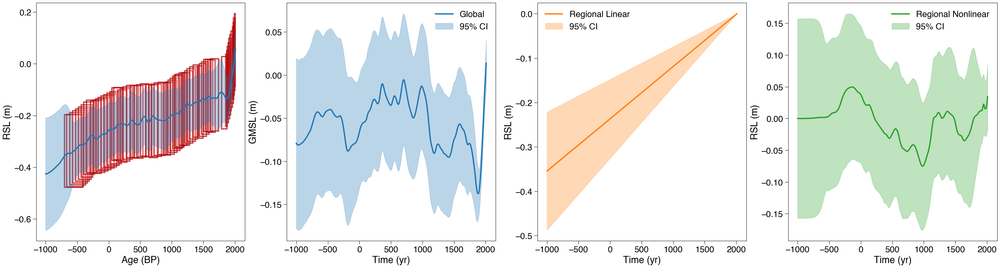

In [51]:
plt.figure(figsize=(40,10))
ax = plt.subplot(141)
data_index = np.sum(np.abs(X_all[:,1:]-data_point),axis=1)<1e-3
PSTHM.plotting.plot_uncertainty_boxes(X_all[:,0][data_index],y_no_GIA[data_index], X_sigma[data_index]*2,y_sigma[data_index]*2,ax=ax)
plt.plot(pred_matrix[:,0],y_mean.detach().numpy(),'C0',linewidth=3,label='Mean Prediction')
plt.fill_between(pred_matrix[:,0],y_mean.detach().numpy()-2*y_std.detach().numpy(),y_mean.detach().numpy()+2*y_std.detach().numpy(),color='C0',alpha=0.3,label='95% CI')
plt.subplot(142)
plt.plot(test_age,global_mean.detach().numpy(),'C0',linewidth=3,label='Global')
plt.fill_between(test_age,global_mean.detach().numpy()-2*global_std.detach().numpy(),global_mean.detach().numpy()+2*global_std.detach().numpy(),color='C0',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('GMSL (m)')
plt.legend()
plt.subplot(143)
plt.plot(test_age,regional_linear_mean.detach().numpy(),'C1',linewidth=3,label='Regional Linear')
plt.fill_between(test_age,regional_linear_mean.detach().numpy()-2*regional_linear_std.detach().numpy(),regional_linear_mean.detach().numpy()+2*regional_linear_std.detach().numpy(),color='C1',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (m)')
plt.legend()
plt.subplot(144)
plt.plot(test_age,regional_nl_mean.detach().numpy(),'C2',linewidth=3,label='Regional Nonlinear')
plt.fill_between(test_age,regional_nl_mean.detach().numpy()-2*regional_nl_std.detach().numpy(),regional_nl_mean.detach().numpy()+2*regional_nl_std.detach().numpy(),color='C2',alpha=0.3,label='95% CI')
plt.xlabel('Time (yr)')
plt.ylabel('RSL (m)')
plt.legend();

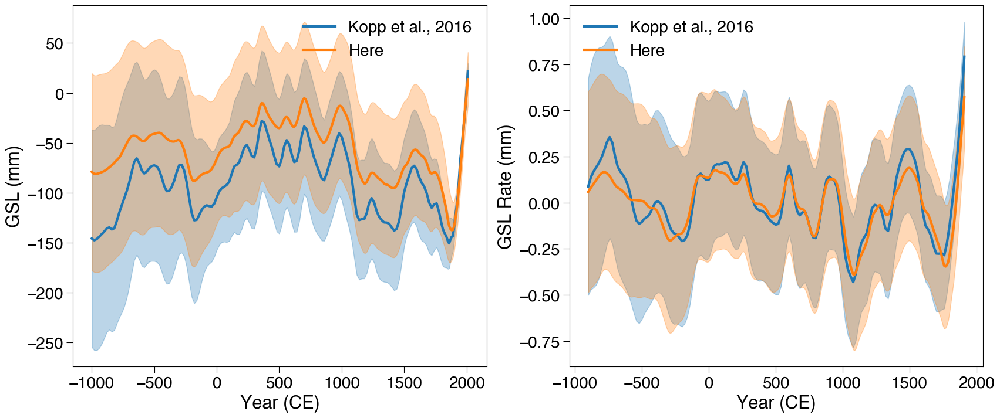

In [53]:
kopp2016 = pd.read_excel('../4.Applications/IFILES/Kopp2016.xls',sheet_name=1,skiprows=2)
kopp2016_cov = pd.read_excel('../4.Applications/IFILES/Kopp2016.xls',sheet_name=6,skiprows=2).iloc[:,1:]
rsl_time,rsl_rate,rsl_rate_sd = PSTHM.post.cal_rate_var(pred_matrix[:,0].detach().numpy(),global_var.detach().numpy(),global_mean.detach().numpy())
kopp2016_rsl_time,kopp2016_rsl_rate,kopp2016_rsl_rate_sd = PSTHM.post.cal_rate_var(kopp2016['Year'].values,kopp2016_cov,kopp2016['mm'])

plt.figure(figsize=(20,8))
plt.subplot(121)
plt.plot(kopp2016['Year'], kopp2016['mm'],label='Kopp et al., 2016',lw=3)
plt.fill_between(kopp2016['Year'],kopp2016['mm']+2*kopp2016['1s'],kopp2016['mm']-2*kopp2016['1s'],alpha=0.3,color='C0')

plt.plot(test_age,global_mean.detach().numpy()*1000,linewidth=3,label='Here')
plt.fill_between(test_age,(global_mean.detach().numpy()-2*global_std.detach().numpy())*1000,(global_mean.detach().numpy()+2*global_std.detach().numpy())*1000,color='C1',alpha=0.3)
plt.ylabel('GSL (mm)')
plt.xlabel('Year (CE)')
plt.legend()

plt.subplot(122)
plt.plot(kopp2016_rsl_time,kopp2016_rsl_rate,label='Kopp et al., 2016',lw=3)
plt.fill_between(kopp2016_rsl_time,kopp2016_rsl_rate+2*kopp2016_rsl_rate_sd,kopp2016_rsl_rate-2*kopp2016_rsl_rate_sd,alpha=0.3,color='C0')
plt.plot(rsl_time,rsl_rate*1000,label='Here',lw=3)
plt.fill_between(rsl_time,(rsl_rate-2*rsl_rate_sd)*1000,(rsl_rate+2*rsl_rate_sd)*1000,alpha=0.3,color='C1')
plt.ylabel('GSL Rate (mm)')
plt.xlabel('Year (CE)')
plt.legend()

**Using the hyperparameters from Kopp et al., 2016**

In [54]:
pyro.clear_param_store()

gpr.kernel.kern0.kern0.kern0.kern0.kern0.variance = 0.0032832899999999995
gpr.kernel.kern0.kern0.kern0.kern0.kern0.lengthscale = 100

gpr.kernel.kern0.kern0.kern0.kern0.kern1.kern0.variance=1.21e-06
gpr.kernel.kern0.kern0.kern0.kern0.kern1.kern1.s_lengthscale=0.09599310885968812

gpr.kernel.kern0.kern0.kern0.kern1.kern1.s_lengthscale = 0.1117010721276371
gpr.kernel.kern0.kern0.kern0.kern1.kern0.variance = 0.00259081
gpr.kernel.kern0.kern0.kern0.kern1.kern0.lengthscale = 100

gpr.kernel.kern0.kern1.variance = torch.tensor(0.00032761000000000004)
gpr.kernel.kern0.kern0.kern1.variance = torch.tensor(0.00043680999999999993)
gpr.kernel.kern1.variance = torch.tensor(0.014641)

In [57]:
#calculate sea-level change with new hyperparameters
gpr.y = torch.tensor(y_no_GIA)

test_age = np.arange(-1000,2020,10)
#generate prediction for one location
data_point = X_all[100,1:]
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,*data_point)
y_mean, y_var = gpr(pred_matrix, full_cov=True)
y_std = y_var.diag().sqrt()
#-----------------define the kernel to decompose-----------------
test_global_kernel =   PSTHM.kernels.Sum(gpr.kernel.kern0.kern0.kern0.kern0.kern0,gpr.kernel.kern1)
regional_linear_kernel =gpr.kernel.kern0.kern0.kern0.kern0.kern1
regional_nl_kernel = gpr.kernel.kern0.kern0.kern0.kern1

#-----------------decompose the kernel-----------------
global_dep,reigonal_linear_dep,regional_nl_dep = PSTHM.post.decompose_kernels(gpr,pred_matrix,[test_global_kernel,regional_linear_kernel,regional_nl_kernel])
global_mean,global_var = global_dep
global_std = global_var.diag().sqrt()

regional_linear_mean,regional_linear_var = reigonal_linear_dep
regional_linear_std = regional_linear_var.diag().sqrt()

regional_nl_mean,regional_nl_var = regional_nl_dep
regional_nl_std = regional_nl_var.diag().sqrt()



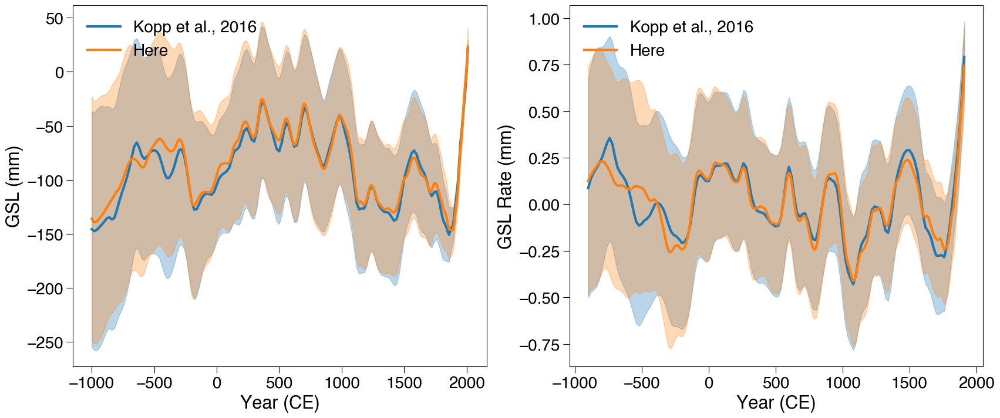

In [60]:
kopp2016 = pd.read_excel('../4.Applications/IFILES/Kopp2016.xls',sheet_name=1,skiprows=2)
kopp2016_cov = pd.read_excel('../4.Applications/IFILES/Kopp2016.xls',sheet_name=6,skiprows=2).iloc[:,1:]
rsl_time,rsl_rate,rsl_rate_sd = PSTHM.post.cal_rate_var(pred_matrix[:,0].detach().numpy(),global_var.detach().numpy(),global_mean.detach().numpy())
kopp2016_rsl_time,kopp2016_rsl_rate,kopp2016_rsl_rate_sd = PSTHM.post.cal_rate_var(kopp2016['Year'].values,kopp2016_cov,kopp2016['mm'])

plt.figure(figsize=(20,8))
plt.subplot(121)
plt.plot(kopp2016['Year'], kopp2016['mm'],label='Kopp et al., 2016',lw=3)
plt.fill_between(kopp2016['Year'],kopp2016['mm']+2*kopp2016['1s'],kopp2016['mm']-2*kopp2016['1s'],alpha=0.3,color='C0')

plt.plot(test_age,global_mean.detach().numpy()*1000,linewidth=3,label='Here')
plt.fill_between(test_age,(global_mean.detach().numpy()-2*global_std.detach().numpy())*1000,(global_mean.detach().numpy()+2*global_std.detach().numpy())*1000,color='C1',alpha=0.3)
plt.ylabel('GSL (mm)')
plt.xlabel('Year (CE)')
plt.legend()

plt.subplot(122)
plt.plot(kopp2016_rsl_time,kopp2016_rsl_rate,label='Kopp et al., 2016',lw=3)
plt.fill_between(kopp2016_rsl_time,kopp2016_rsl_rate+2*kopp2016_rsl_rate_sd,kopp2016_rsl_rate-2*kopp2016_rsl_rate_sd,alpha=0.3,color='C0')
plt.plot(rsl_time,rsl_rate*1000,label='Here',lw=3)
plt.fill_between(rsl_time,(rsl_rate-2*rsl_rate_sd)*1000,(rsl_rate+2*rsl_rate_sd)*1000,alpha=0.3,color='C1')
plt.ylabel('GSL Rate (mm)')
plt.xlabel('Year (CE)')
plt.legend();

**Replicate key metrices provided in Kopp et al., 2016**


- Global sea level (GSL) rose 0.1 +/- 0.1 mm/yr over 0-700 CE. 
- GSL fall of 0.2 +/- 0.2 mm/y over 1000-1400 CE. 


In [63]:
gpr.y = torch.tensor(y)
test_age = [0,700,1000,1400]
#generate prediction for one location
data_point = X_all[100,1:]
pred_matrix = PSTHM.post.gen_pred_matrix(test_age,*data_point)
test_global_kernel =   PSTHM.kernels.Sum(gpr.kernel.kern0.kern0.kern0.kern0.kern0,gpr.kernel.kern1)
global_dep = PSTHM.post.decompose_kernels(gpr,pred_matrix,[test_global_kernel])
global_mean,global_var = global_dep[0]
global_std = global_var.diag().sqrt()

print('0-700 CE GSL rate: {:5.2f} +/- {:5.2f} mm/yr'.format((global_mean[1]-global_mean[0])/700*1000,np.sqrt(global_std[0]**2 + global_std[1]**2) / 700 *1000*2))
print('1000-1400 CE GSL rate: {:5.2f} +/- {:5.2f} mm/yr'.format((global_mean[3]-global_mean[2])/400*1000,np.sqrt(global_std[3]**2 + global_std[2]**2) /400*1000*2))

0-700 CE GSL rate:  0.09 +/-  0.13 mm/yr
1000-1400 CE GSL rate: -0.22 +/-  0.22 mm/yr
